Comparativa entre simulación (sin defectos) y pieza real (puede tener deefctos)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

In [41]:
!python -m pip install torchvision
!python -m pip install opencv-python


[notice] A new release of pip is available: 23.1.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Definimos una función para cargar y preprocesar las imágenes

def carga_y_preprocesamiento(folder, img_size=(988, 593), depth_limit=512):
    files = sorted(os.listdir(folder))
    if depth_limit:
        files = files[:depth_limit]

    stack = []
    for file in files:
        path = os.path.join(folder, file)
        img = cv2.imread(path)  # BGR
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir a RGB
        img = cv2.resize(img, img_size)
        img = img.astype("float32") / 255.0  # Normalizar
        img = np.transpose(img, (2, 0, 1))  # (H, W, C) → (C, H, W)
        stack.append(img)

    volume = np.stack(stack, axis=1)  # (C, D, H, W)
    tensor = torch.tensor(volume, dtype=torch.float32)
    return tensor  # shape: (3, depth, height, width)

In [3]:
# Vamos a cargar las imágenes

Simulacion_nudo_1 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_1', depth_limit=None)
Simulacion_nudo_2 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_2', depth_limit=None)
Simulacion_nudo_3 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_3', depth_limit=None)
Simulacion_nudo_4 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_4', depth_limit=None)
Simulacion_nudo_5 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Simulacion\Nudo_5', depth_limit=None)

Real_nudo_1 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_1', depth_limit=None)
Real_nudo_2 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_2', depth_limit=None)
Real_nudo_3 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_3', depth_limit=None)
Real_nudo_4 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_4', depth_limit=None)
Real_nudo_5 = carga_y_preprocesamiento(r'C:\Users\unidad-epa\Desktop\Iker\Scripts\Simulacion-Real\Real\Nudo_5', depth_limit=None)

# Añadir dimensión de batch → (1, 3, D, H, W)

Simulacion_nudo_1 = Simulacion_nudo_1.unsqueeze(0)
Simulacion_nudo_2 = Simulacion_nudo_2.unsqueeze(0)
Simulacion_nudo_3 = Simulacion_nudo_3.unsqueeze(0)
Simulacion_nudo_4 = Simulacion_nudo_4.unsqueeze(0)
Simulacion_nudo_5 = Simulacion_nudo_5.unsqueeze(0)

# Concatenamos las simulaciones para entrenar la red
simulaciones=torch.cat([
    Simulacion_nudo_1,
    Simulacion_nudo_2,
    Simulacion_nudo_3,
    Simulacion_nudo_4,
    Simulacion_nudo_5
], dim=0)  


Real_nudo_1 = Real_nudo_1.unsqueeze(0)
Real_nudo_2 = Real_nudo_2.unsqueeze(0)
Real_nudo_3 = Real_nudo_3.unsqueeze(0)
Real_nudo_4 = Real_nudo_4.unsqueeze(0)
Real_nudo_5 = Real_nudo_5.unsqueeze(0)

In [44]:
Real_nudo_1.shape

torch.Size([1, 3, 100, 593, 988])

Vamos a usar una arquitectura autoencoder (encoder-decoder). Esta red aprende a comprimir y reconstruir las imágenes de entrada. La idea es entonces entrenar a la red con las simulaciones sin defectos, y luego pasarle las imágenes con defectos. De esta forma, fallará a la hora de la reconstrucció en los poros, y podremos identificar los defectos como las zonas con mayores defectos en la reconstrucción.

In [4]:

BATCH_SIZE = 32
EPOCHS = 50
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Vamos a definir un autoencoder para hacer la comparativa entre imágenes

class Autoencoder3D(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv3d(3, 8, kernel_size=3, stride=2, padding=1), nn.ReLU(),
            nn.Conv3d(8, 16, kernel_size=3, stride=2, padding=1), nn.ReLU(),
            nn.Conv3d(16, 32, kernel_size=3, stride=2, padding=1), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose3d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1), nn.ReLU(),
            nn.ConvTranspose3d(16, 8, kernel_size=3, stride=2, padding=1, output_padding=1), nn.ReLU(),
            nn.ConvTranspose3d(8, 3, kernel_size=3, stride=2, padding=1, output_padding=1), nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        print(x.shape)
        x = self.decoder(x)
        print(x.shape)
        return x


In [5]:

# Vamos a entrenar nuestro modelo
model = Autoencoder3D().to(DEVICE)

input_tensor = simulaciones.to(DEVICE)  


# Definimos la pérdida y el optimizador
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
input_tensor = input_tensor[:, :, :96, :, :]

# Entrenamiento
EPOCHS = 50
model.train()
for epoch in range(EPOCHS):
    optimizer.zero_grad()
    
    output = model(input_tensor)
   
    mask = (input_tensor.sum(dim=1, keepdim=True) > 0.01).float()  # Máscara de voxels no-negros
    if output.shape != input_tensor.shape:
    # Recortamos la salida para que coincida con la entrada (evitamos errores de tamaño)
        min_D = min(output.shape[2], input_tensor.shape[2])
        min_H = min(output.shape[3], input_tensor.shape[3])
        min_W = min(output.shape[4], input_tensor.shape[4])
        output = output[:, :, :min_D, :min_H, :min_W]
        input_tensor = input_tensor[:, :, :min_D, :min_H, :min_W]
    loss = (((output - input_tensor) ** 2) * mask).sum() / mask.sum()
    
    loss.backward()
    optimizer.step()
    
    print(f"Epoch {epoch+1}/{EPOCHS} - Loss: {loss.item():.6f}")

torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 1/50 - Loss: 0.498983
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 2/50 - Loss: 0.498401
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 3/50 - Loss: 0.497824
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 4/50 - Loss: 0.497248
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 5/50 - Loss: 0.496675
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 6/50 - Loss: 0.496105
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 7/50 - Loss: 0.495521
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 8/50 - Loss: 0.494904
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 9/50 - Loss: 0.494233
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600, 992])
Epoch 10/50 - Loss: 0.493478
torch.Size([5, 32, 12, 75, 124])
torch.Size([5, 3, 96, 600,

In [6]:
input_def = Real_nudo_1.to(DEVICE)  

input_def = input_def[:, :, :96, :, :] # más de 96 no deja, no se el motivo
output_def = model(input_def).detach().cpu()
# Recorta la salida para que coincida con la entrada
if output_def.shape != input_def.cpu().shape:
    min_D = min(output_def.shape[2], input_def.shape[2])
    min_H = min(output_def.shape[3], input_def.shape[3])
    min_W = min(output_def.shape[4], input_def.shape[4])
    output_def = output_def[:, :, :min_D, :min_H, :min_W]
    input_def = input_def[:, :, :min_D, :min_H, :min_W]
# Calculamos el mapa de error
error_map = torch.abs(input_def.cpu() - output_def)


torch.Size([1, 32, 12, 75, 124])
torch.Size([1, 3, 96, 600, 992])


Número de píxeles con defecto (solo interior de la pieza): 6825.0
Slice 0: 239 píxeles con defecto


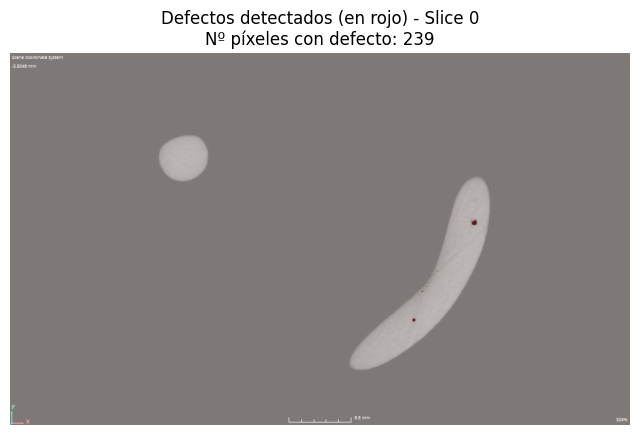

Slice 1: 246 píxeles con defecto


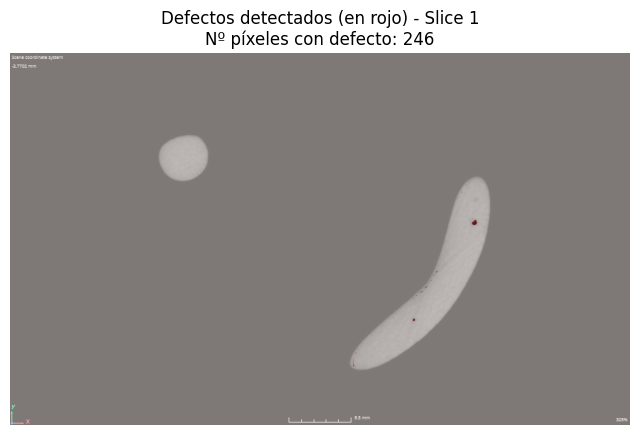

Slice 2: 119 píxeles con defecto


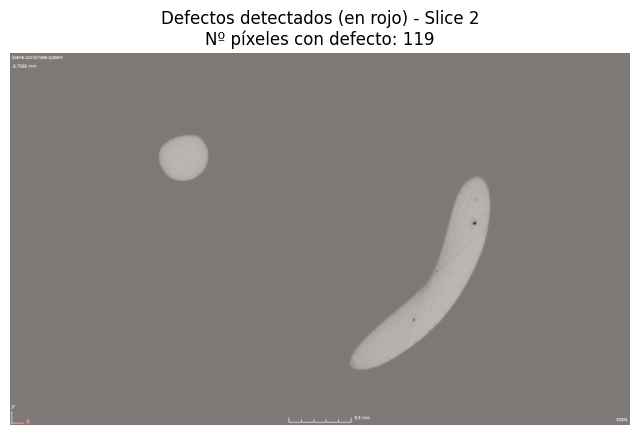

Slice 3: 89 píxeles con defecto


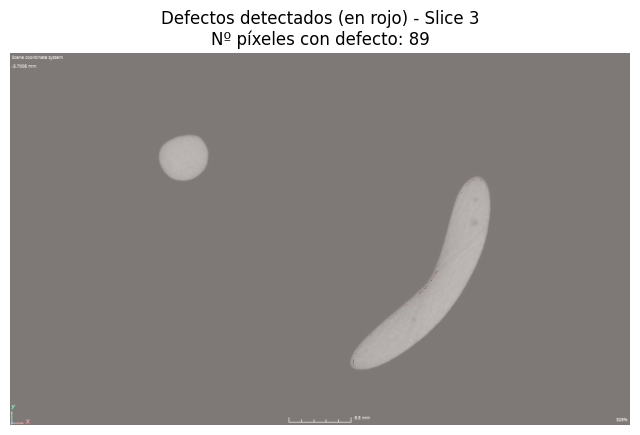

Slice 4: 50 píxeles con defecto


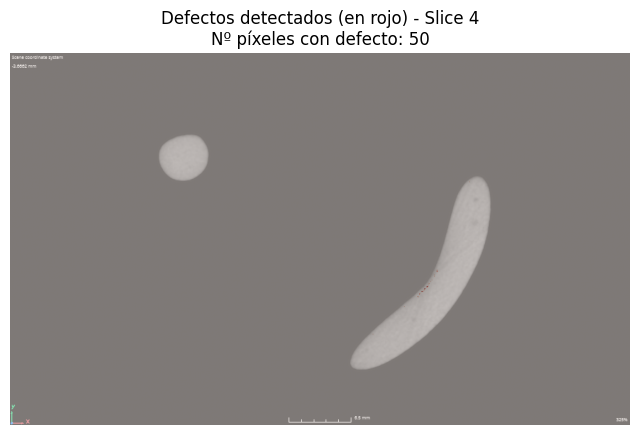

Slice 5: 73 píxeles con defecto


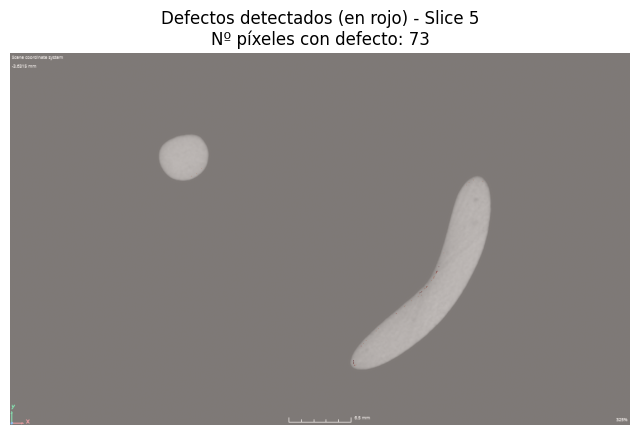

Slice 6: 42 píxeles con defecto


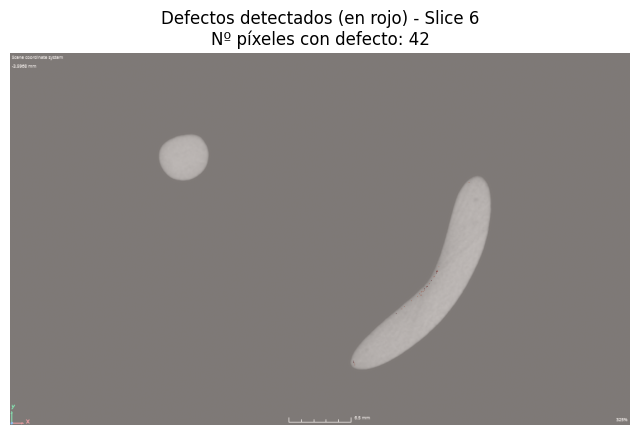

Slice 7: 56 píxeles con defecto


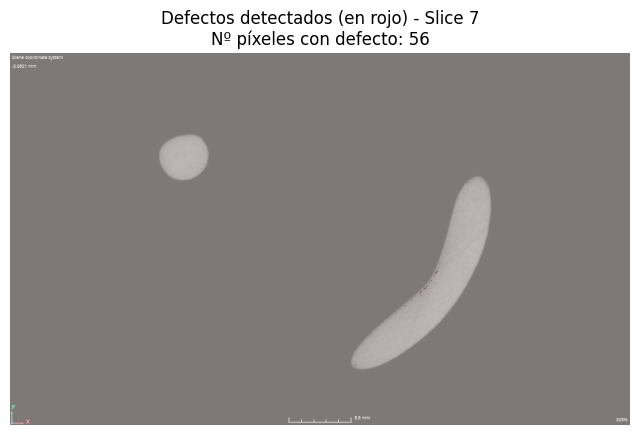

Slice 8: 45 píxeles con defecto


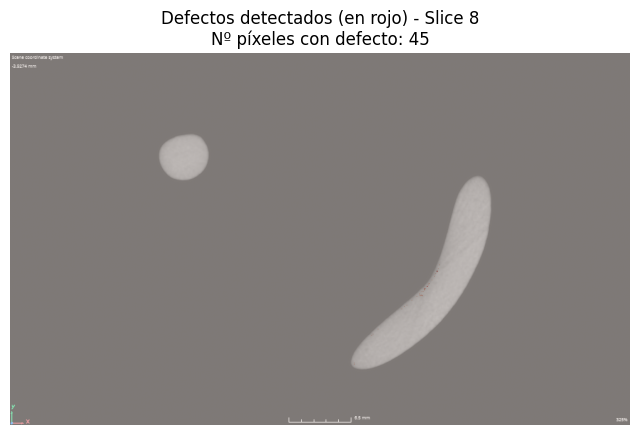

Slice 9: 71 píxeles con defecto


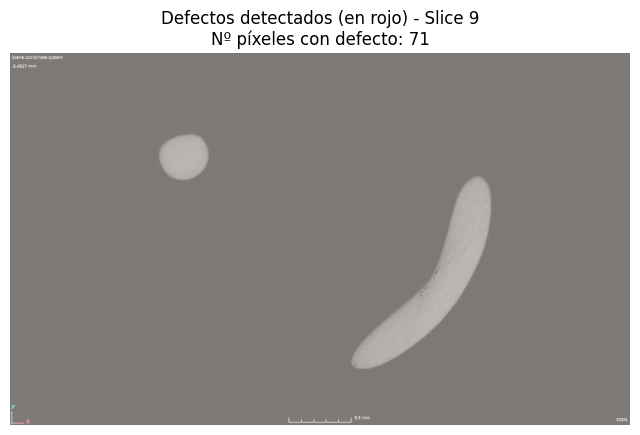

Slice 10: 61 píxeles con defecto


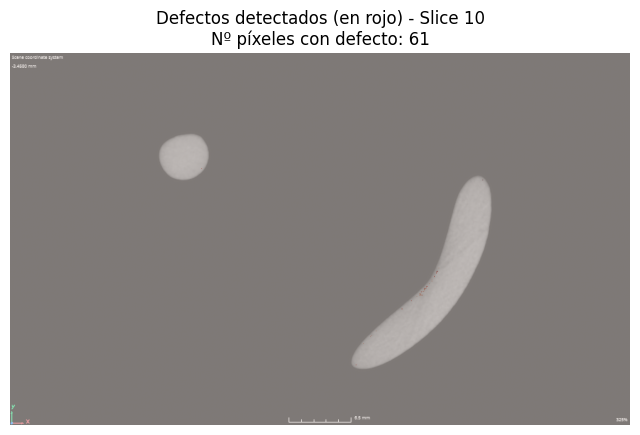

Slice 11: 95 píxeles con defecto


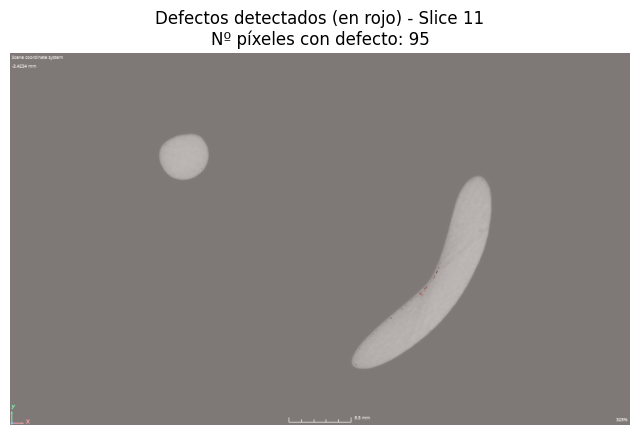

Slice 12: 85 píxeles con defecto


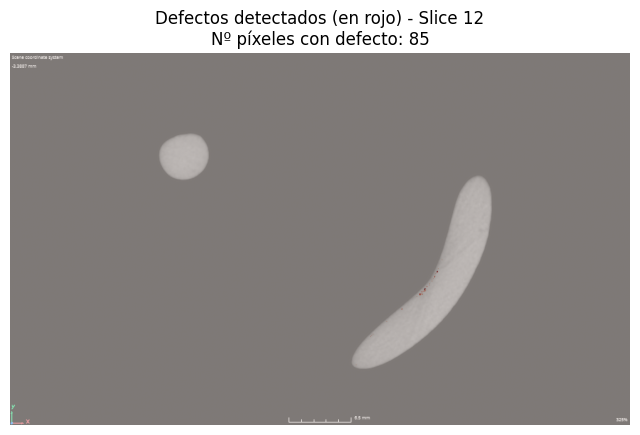

Slice 13: 68 píxeles con defecto


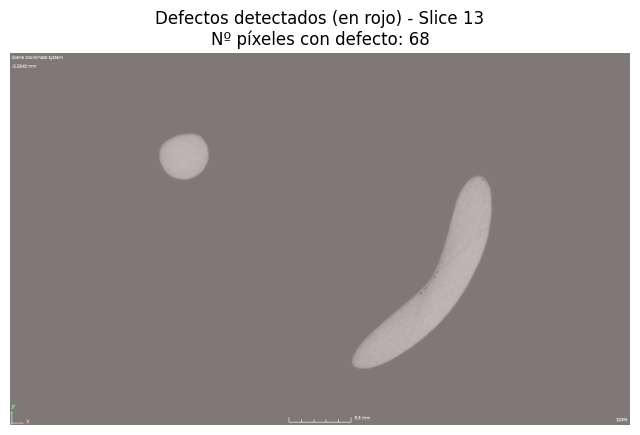

Slice 14: 52 píxeles con defecto


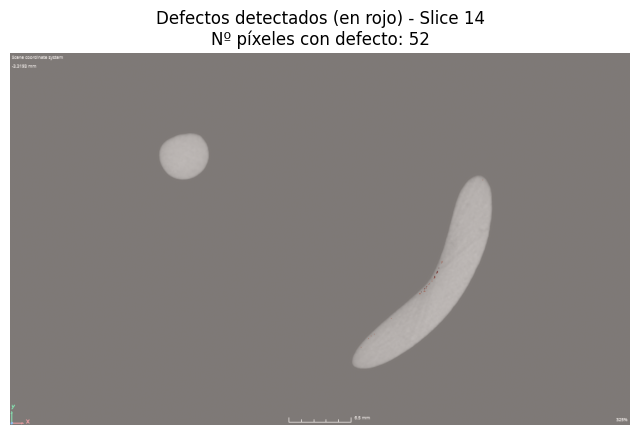

Slice 15: 48 píxeles con defecto


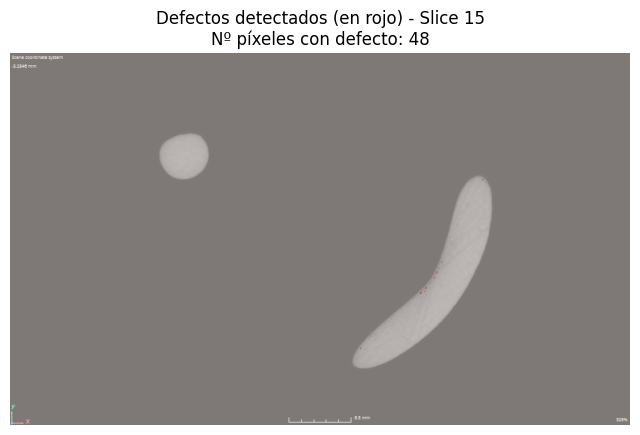

Slice 16: 46 píxeles con defecto


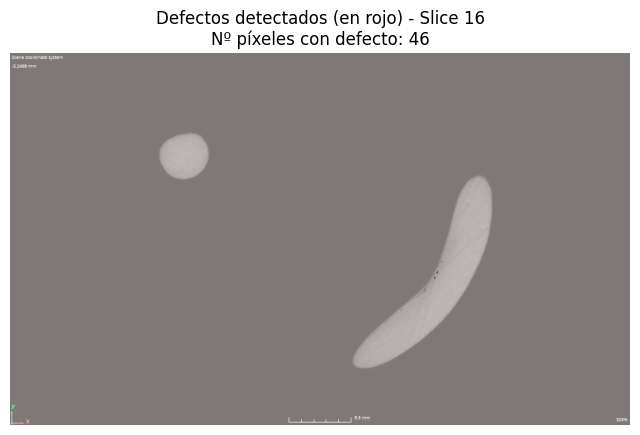

Slice 17: 75 píxeles con defecto


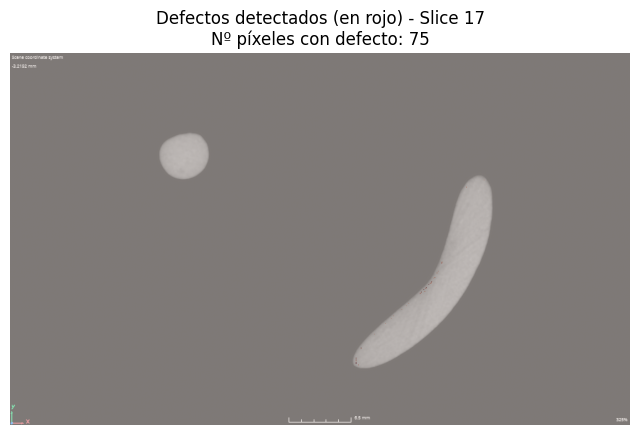

Slice 18: 66 píxeles con defecto


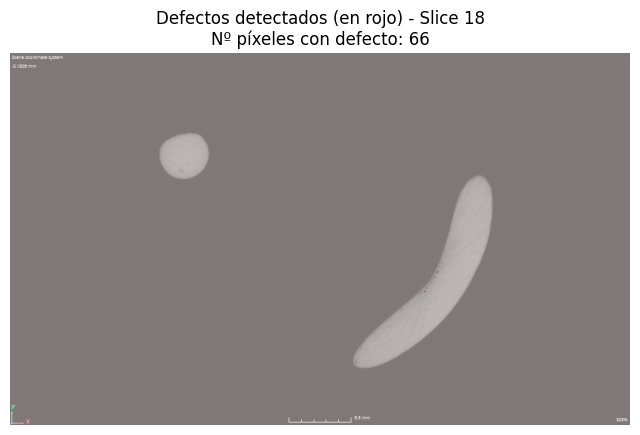

Slice 19: 66 píxeles con defecto


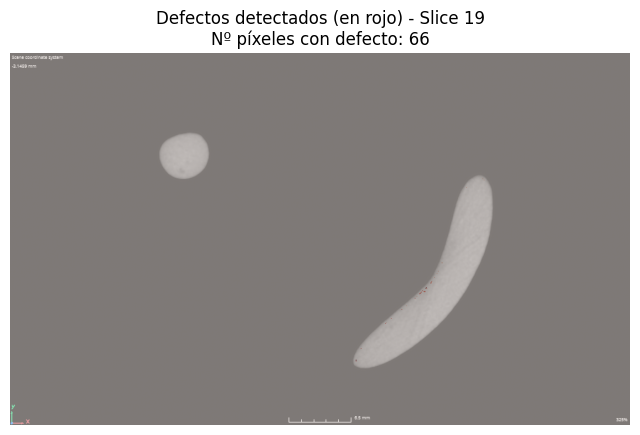

Slice 20: 59 píxeles con defecto


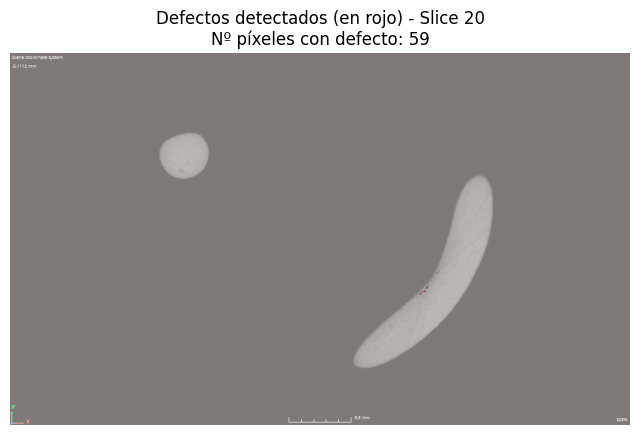

Slice 21: 53 píxeles con defecto


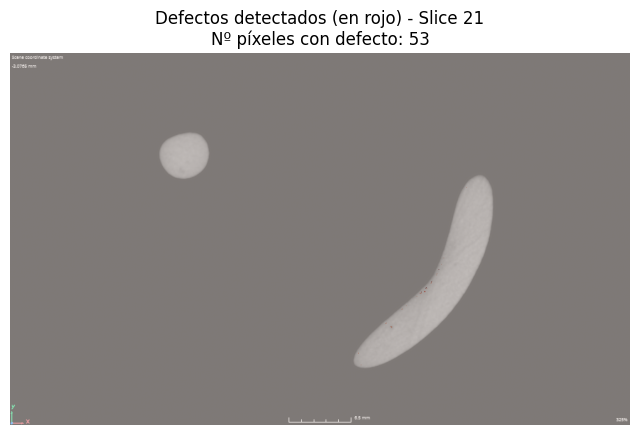

Slice 22: 44 píxeles con defecto


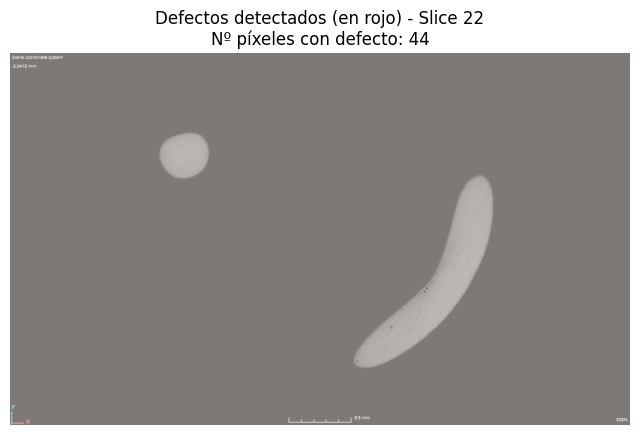

Slice 23: 47 píxeles con defecto


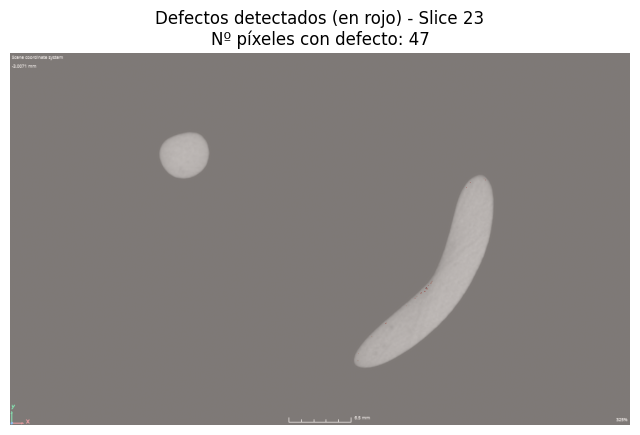

Slice 24: 40 píxeles con defecto


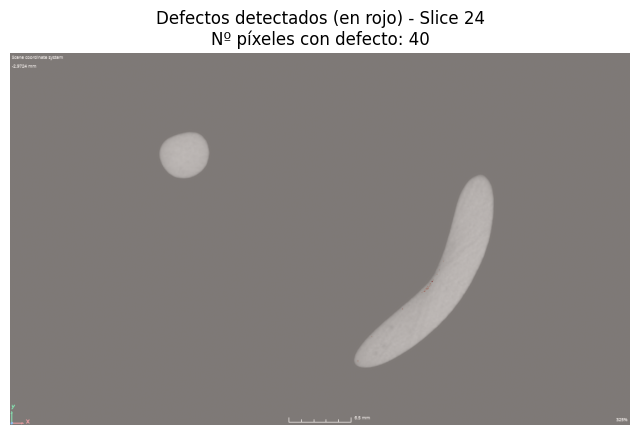

Slice 25: 66 píxeles con defecto


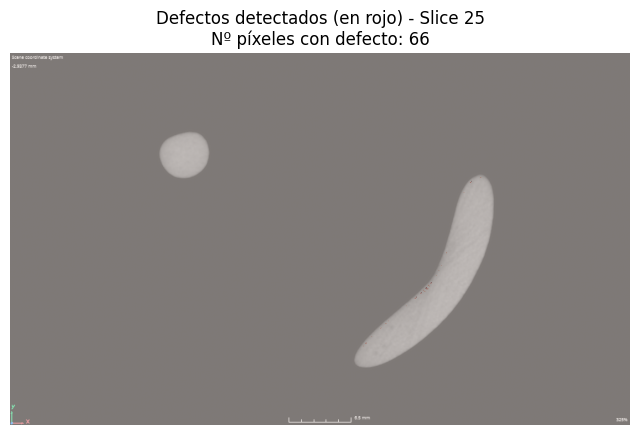

Slice 26: 53 píxeles con defecto


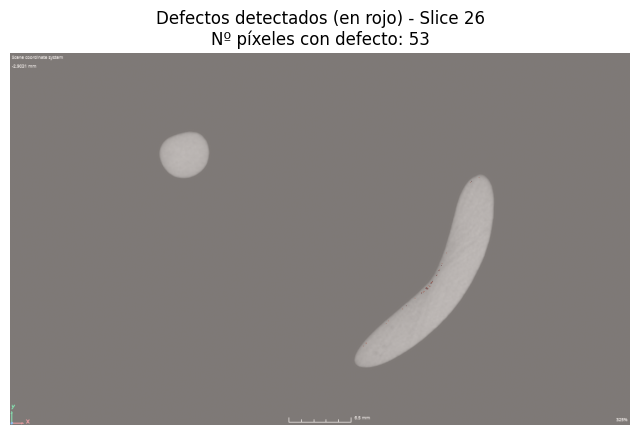

Slice 27: 92 píxeles con defecto


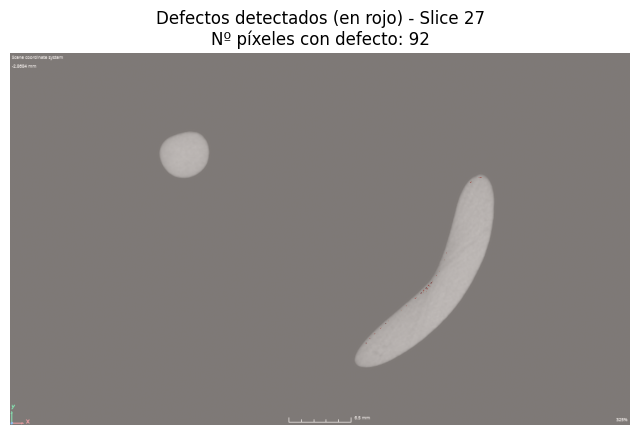

Slice 28: 51 píxeles con defecto


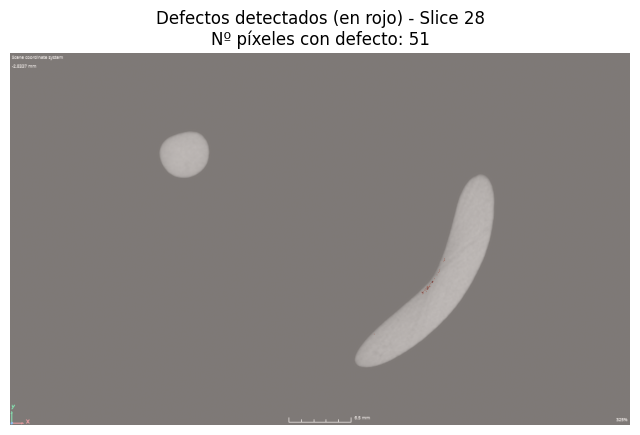

Slice 29: 82 píxeles con defecto


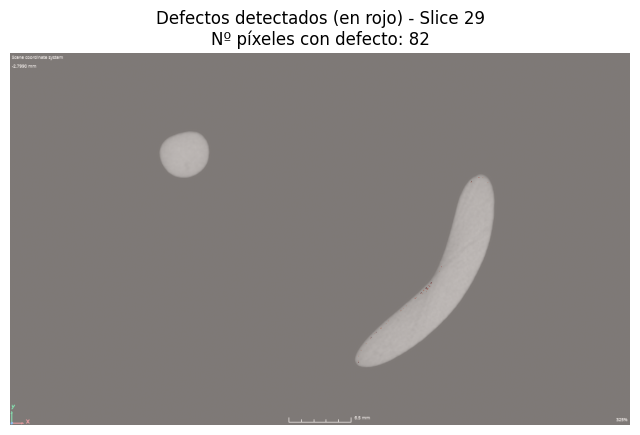

Slice 30: 53 píxeles con defecto


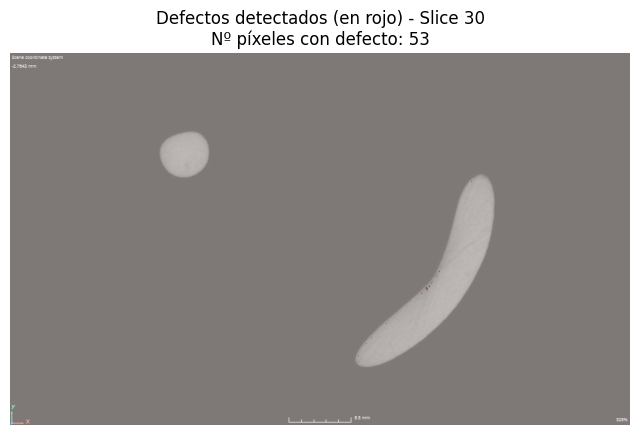

Slice 31: 74 píxeles con defecto


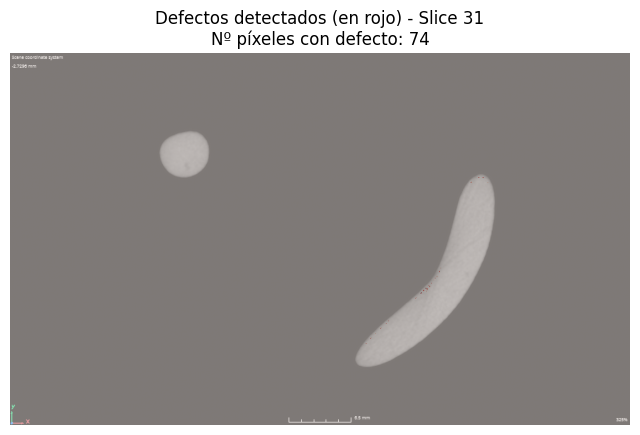

Slice 32: 45 píxeles con defecto


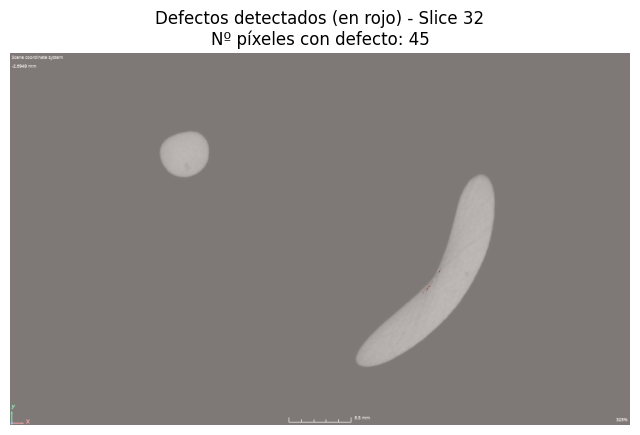

Slice 33: 84 píxeles con defecto


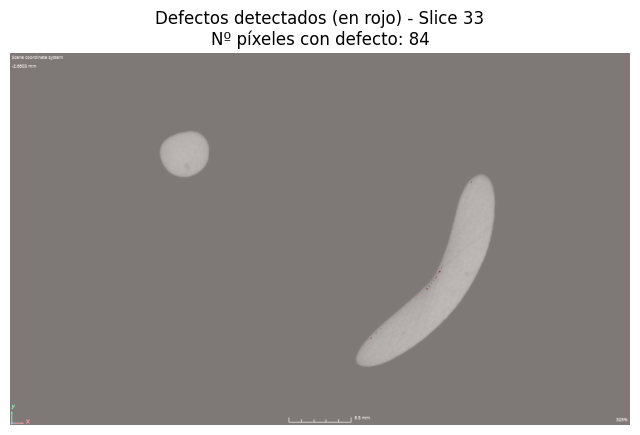

Slice 34: 77 píxeles con defecto


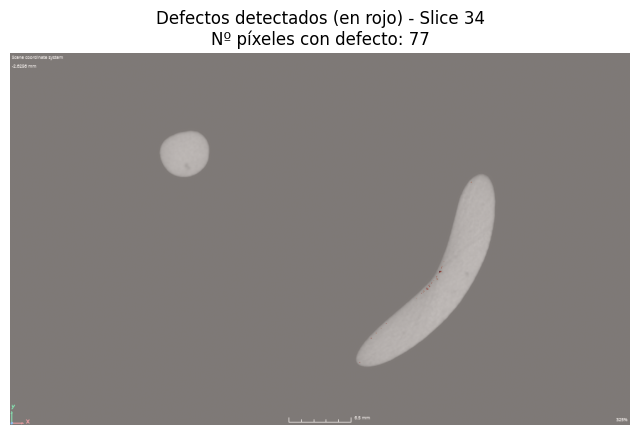

Slice 35: 139 píxeles con defecto


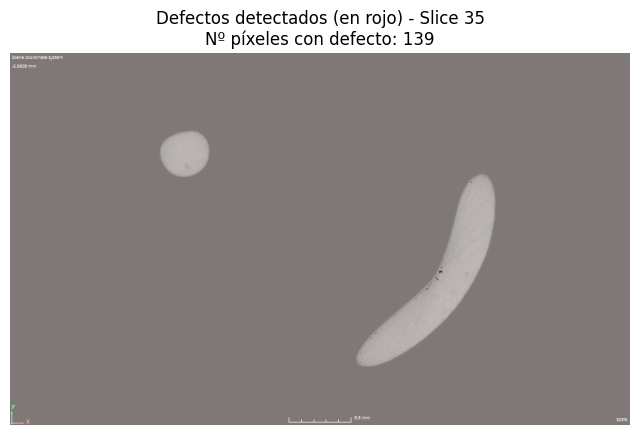

Slice 36: 95 píxeles con defecto


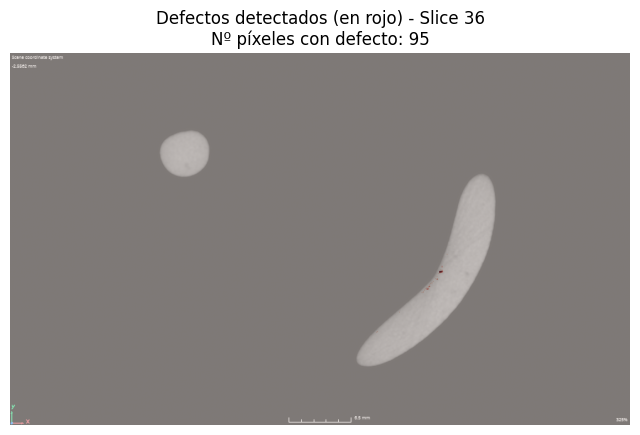

Slice 37: 102 píxeles con defecto


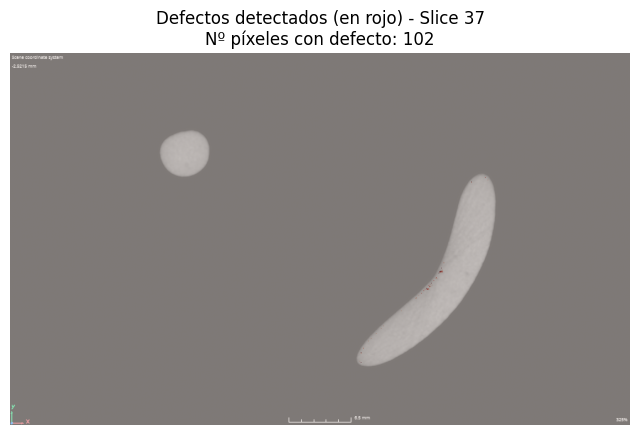

Slice 38: 90 píxeles con defecto


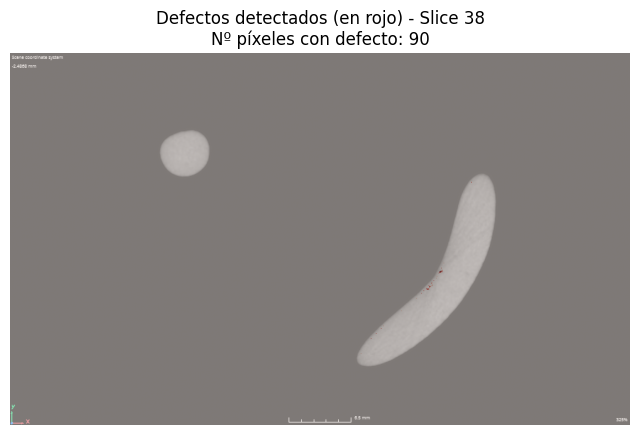

Slice 39: 86 píxeles con defecto


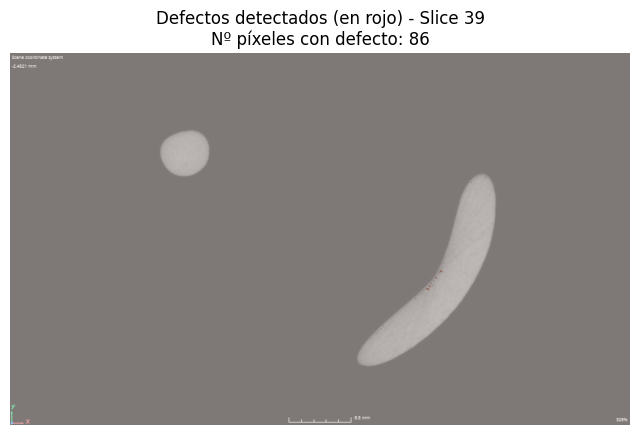

Slice 40: 49 píxeles con defecto


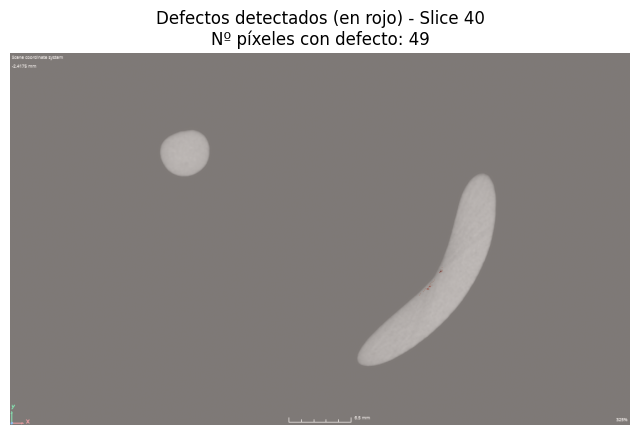

Slice 41: 73 píxeles con defecto


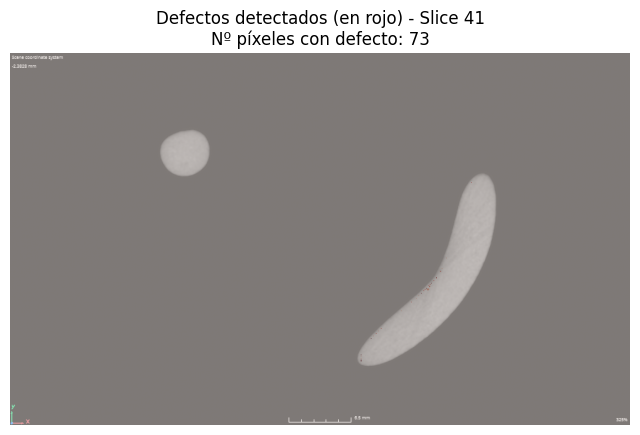

Slice 42: 73 píxeles con defecto


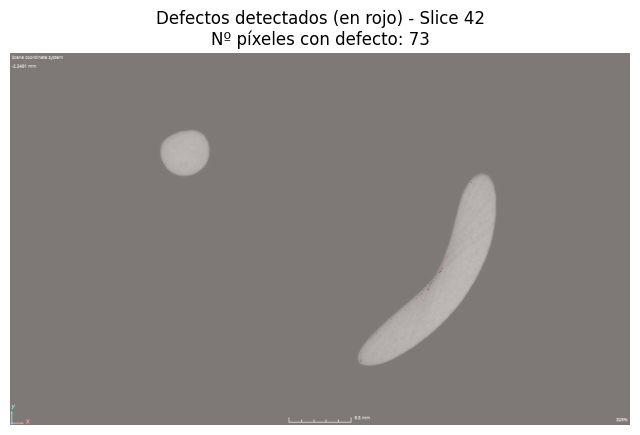

Slice 43: 55 píxeles con defecto


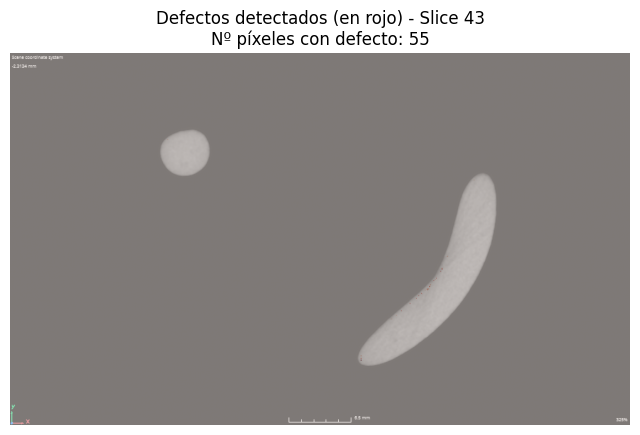

Slice 44: 56 píxeles con defecto


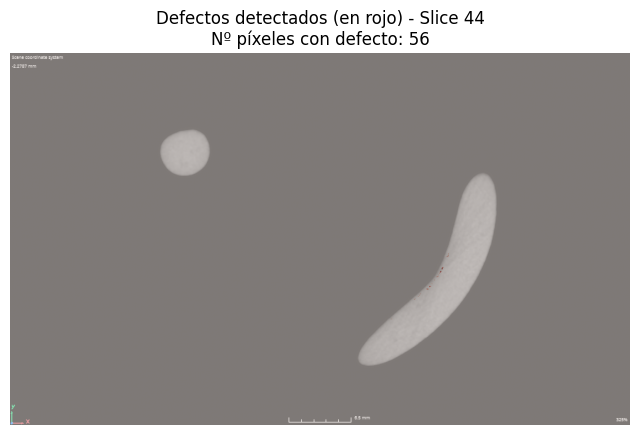

Slice 45: 52 píxeles con defecto


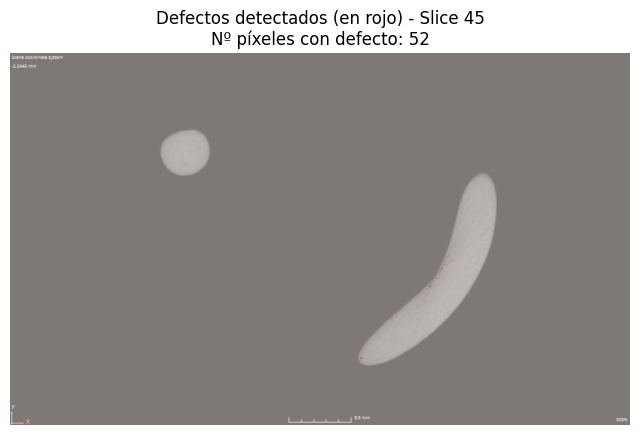

Slice 46: 36 píxeles con defecto


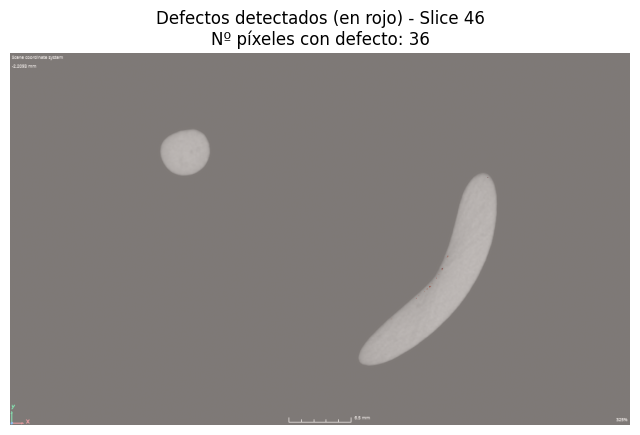

Slice 47: 42 píxeles con defecto


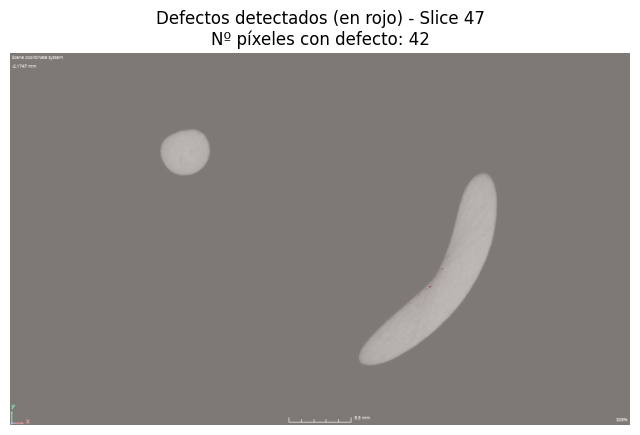

Slice 48: 53 píxeles con defecto


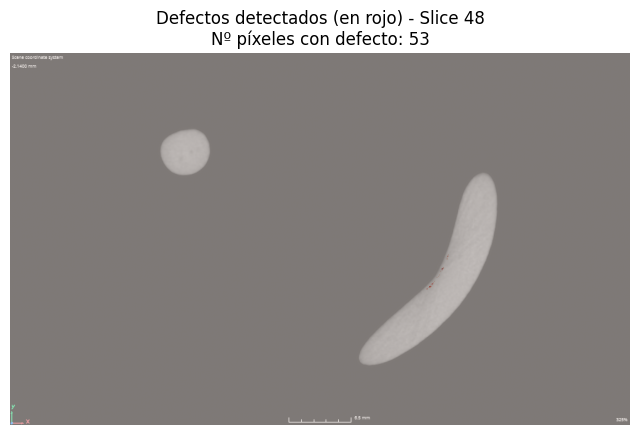

Slice 49: 58 píxeles con defecto


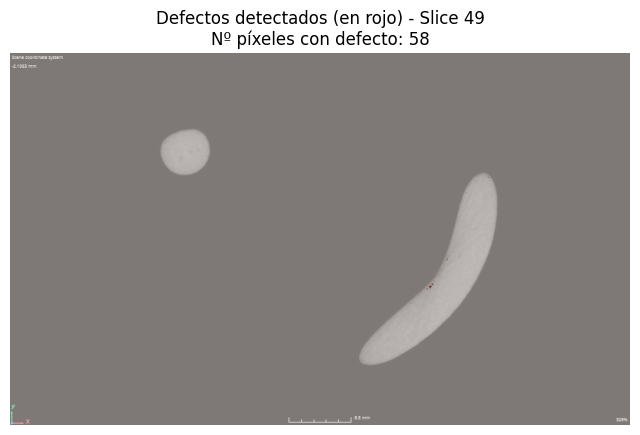

Slice 50: 70 píxeles con defecto


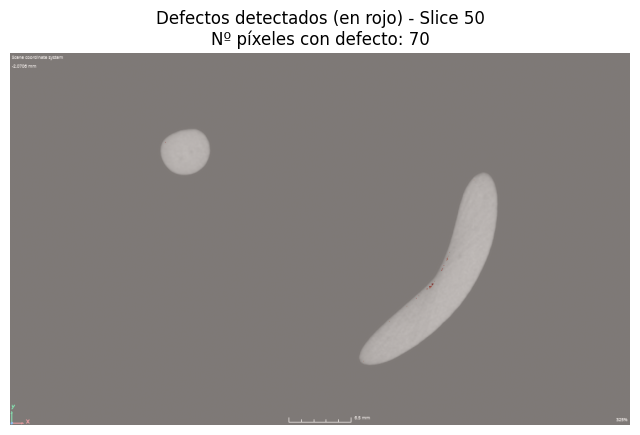

Slice 51: 83 píxeles con defecto


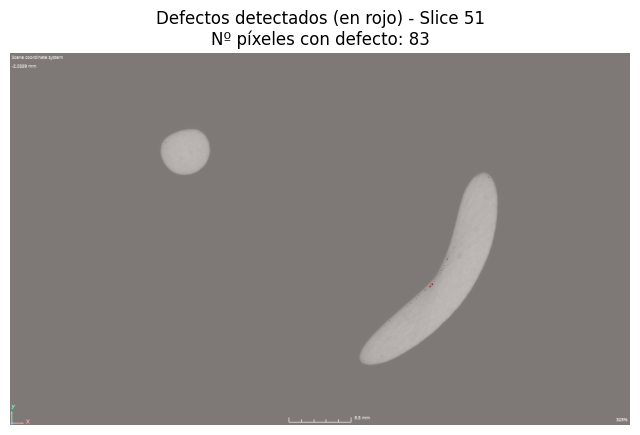

Slice 52: 57 píxeles con defecto


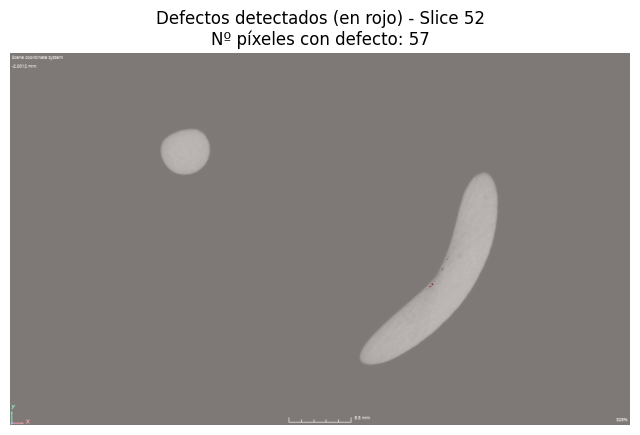

Slice 53: 62 píxeles con defecto


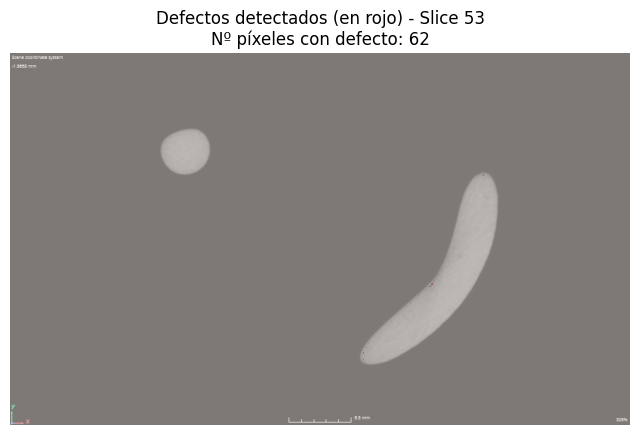

Slice 54: 53 píxeles con defecto


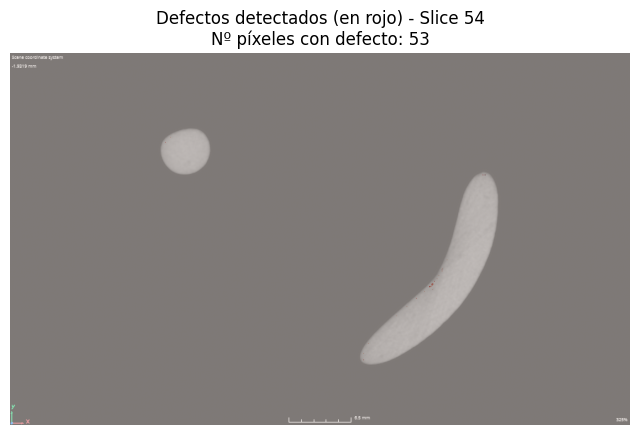

Slice 55: 52 píxeles con defecto


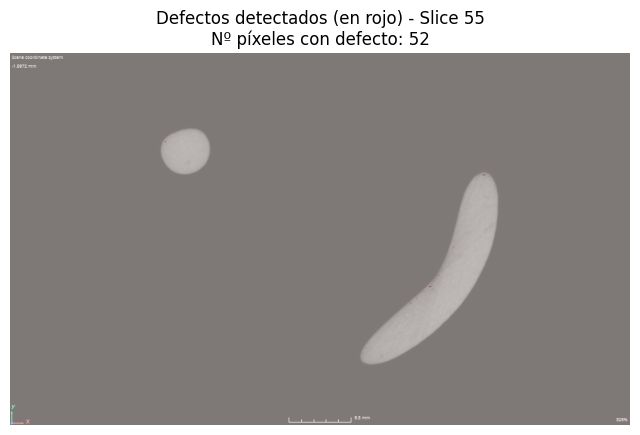

Slice 56: 42 píxeles con defecto


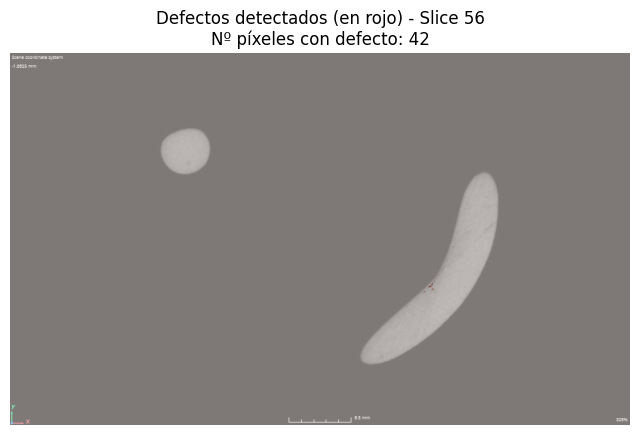

Slice 57: 102 píxeles con defecto


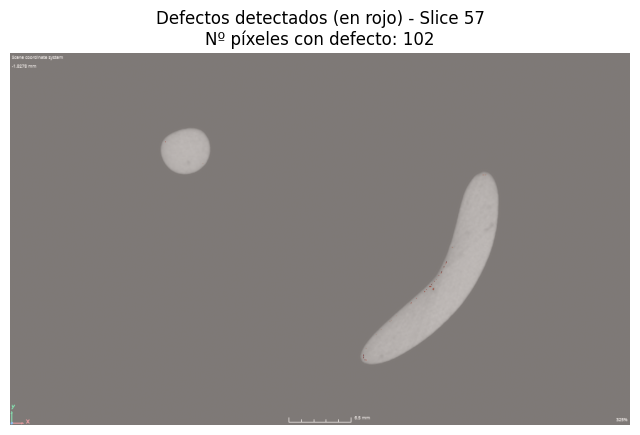

Slice 58: 66 píxeles con defecto


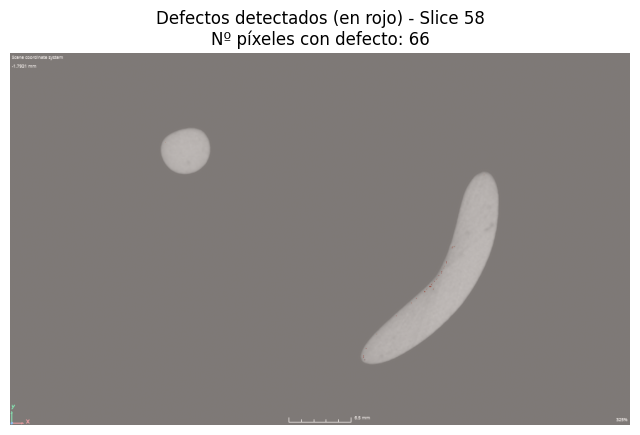

Slice 59: 95 píxeles con defecto


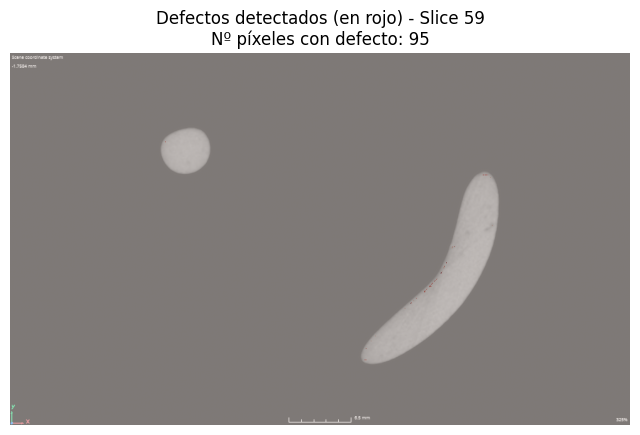

Slice 60: 41 píxeles con defecto


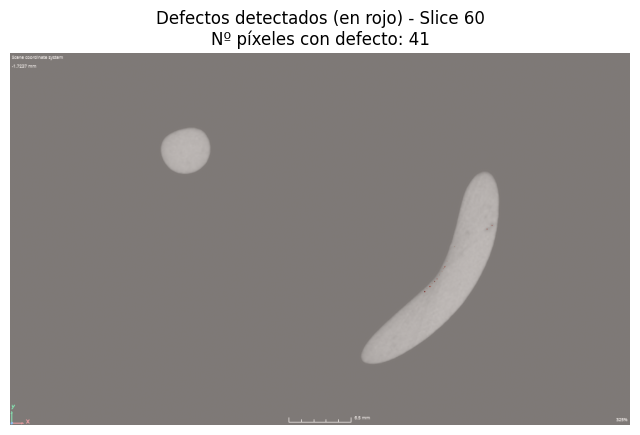

Slice 61: 67 píxeles con defecto


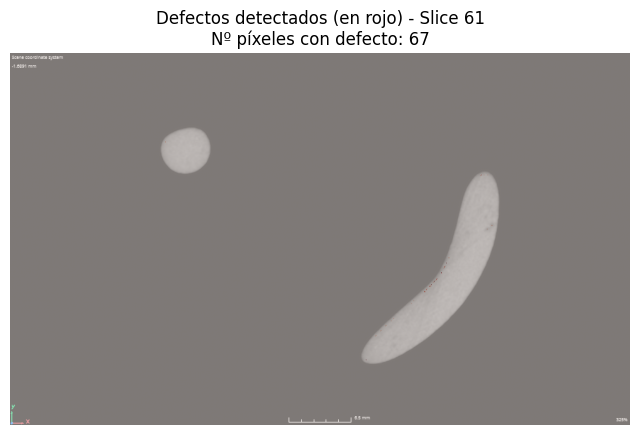

Slice 62: 41 píxeles con defecto


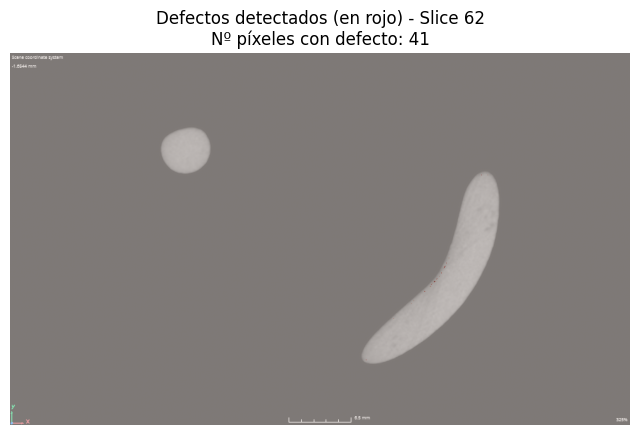

Slice 63: 33 píxeles con defecto


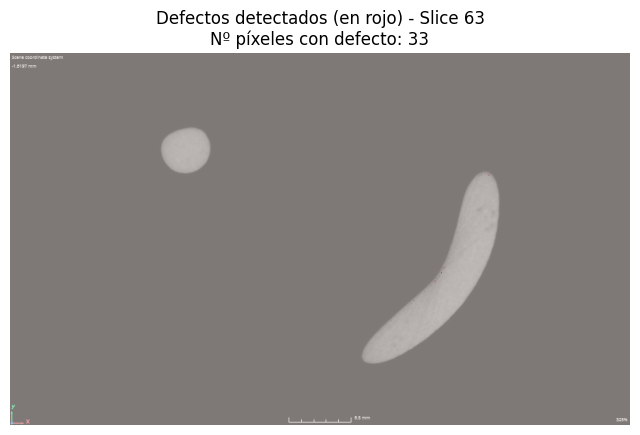

Slice 64: 44 píxeles con defecto


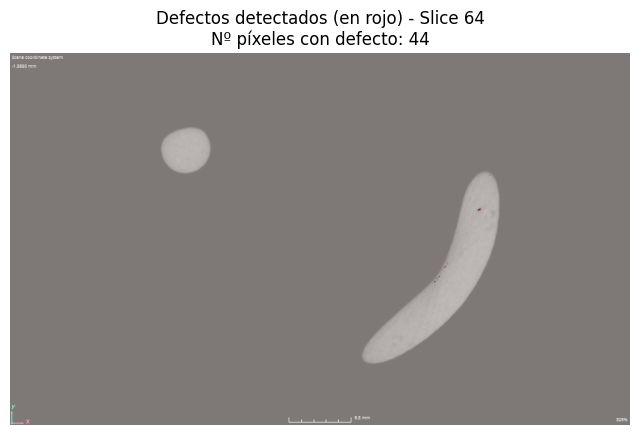

Slice 65: 101 píxeles con defecto


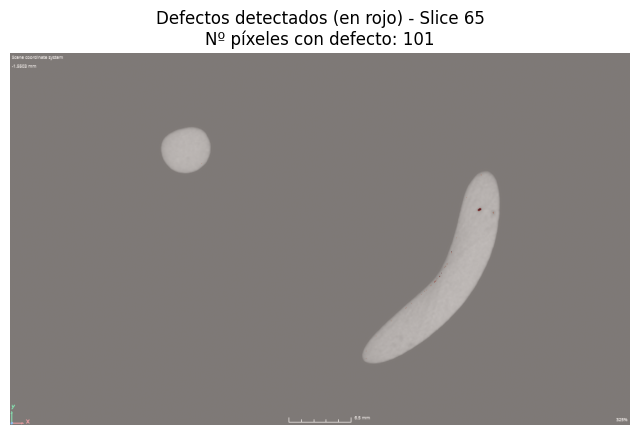

Slice 66: 117 píxeles con defecto


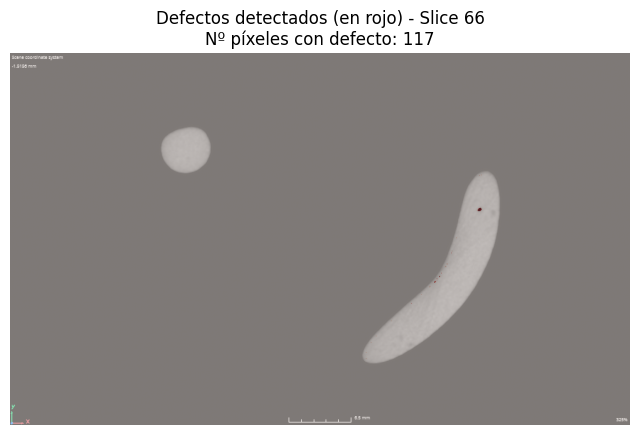

Slice 67: 162 píxeles con defecto


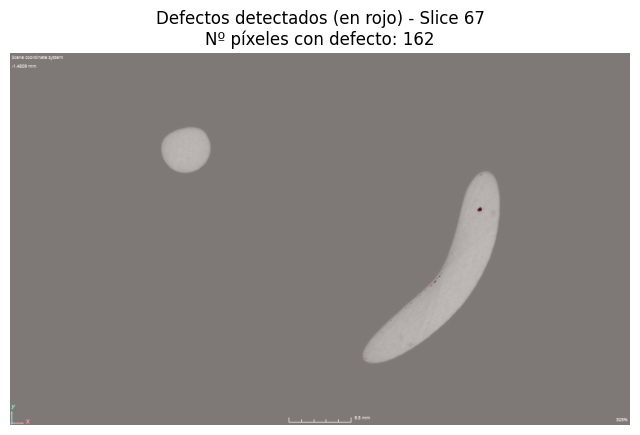

Slice 68: 152 píxeles con defecto


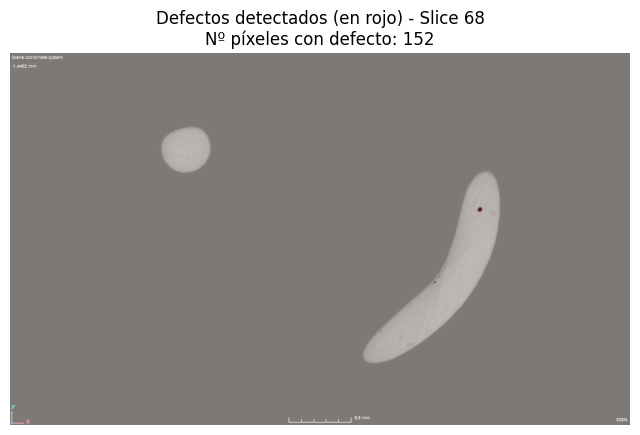

Slice 69: 146 píxeles con defecto


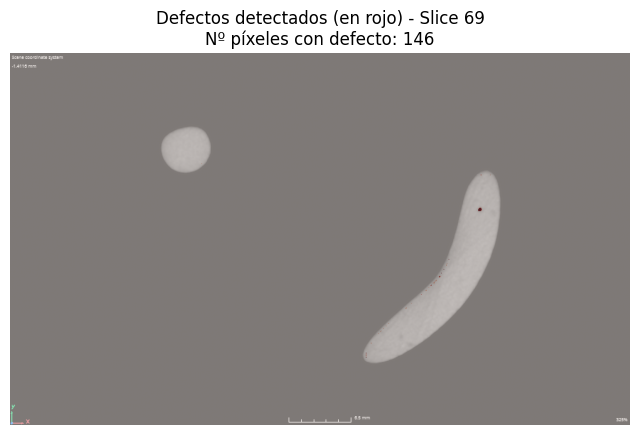

Slice 70: 67 píxeles con defecto


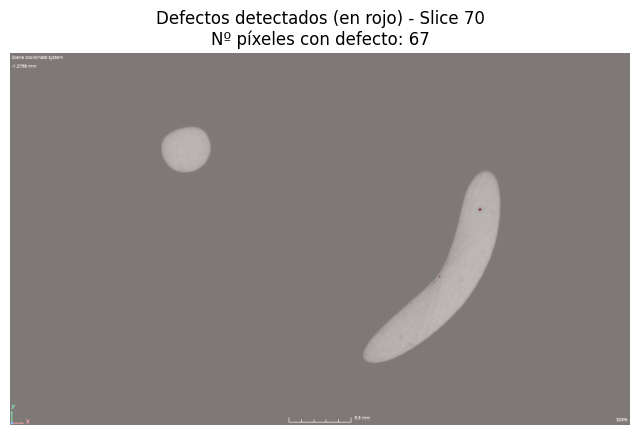

Slice 71: 53 píxeles con defecto


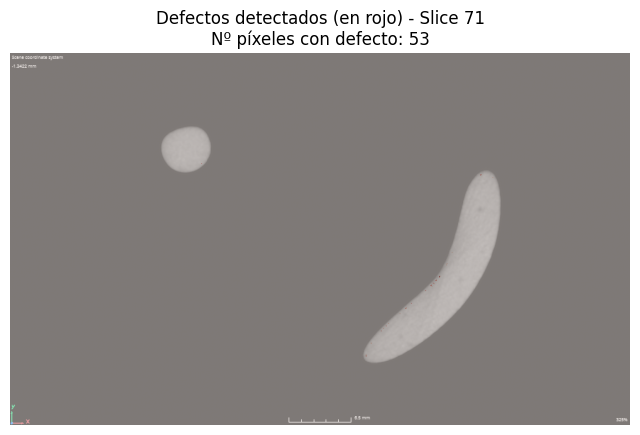

Slice 72: 30 píxeles con defecto


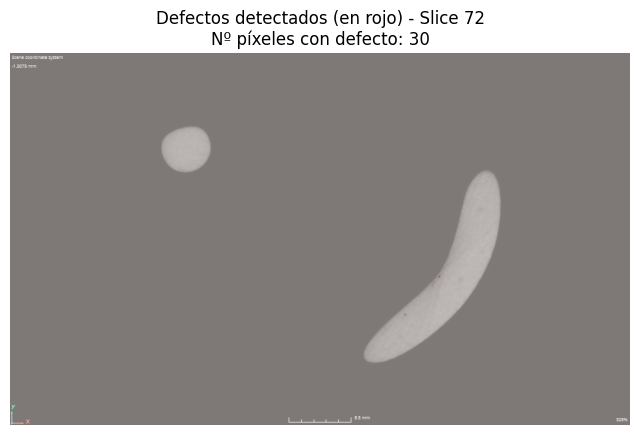

Slice 73: 71 píxeles con defecto


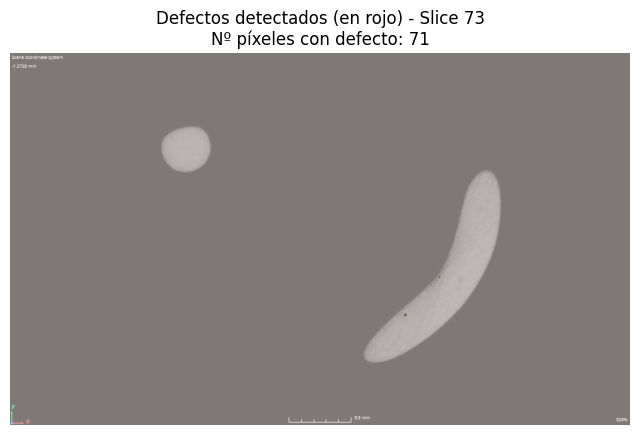

Slice 74: 72 píxeles con defecto


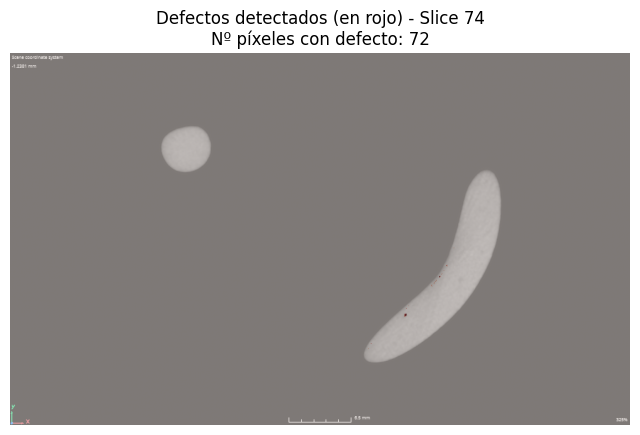

Slice 75: 75 píxeles con defecto


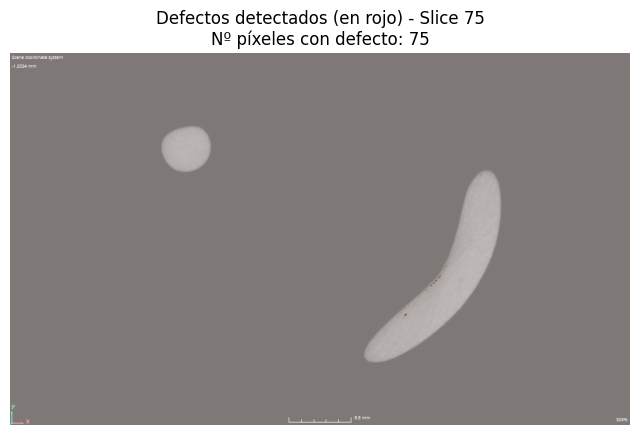

Slice 76: 45 píxeles con defecto


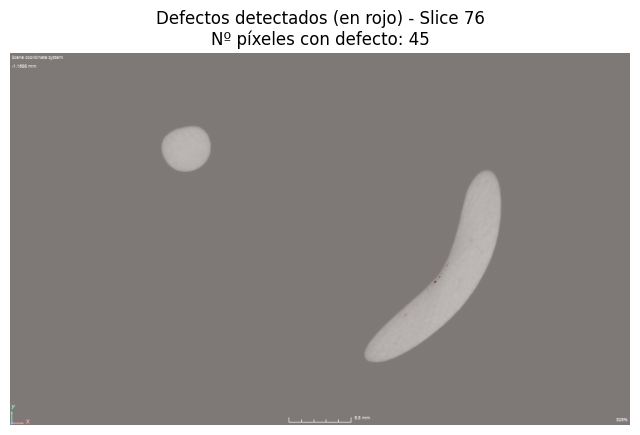

Slice 77: 40 píxeles con defecto


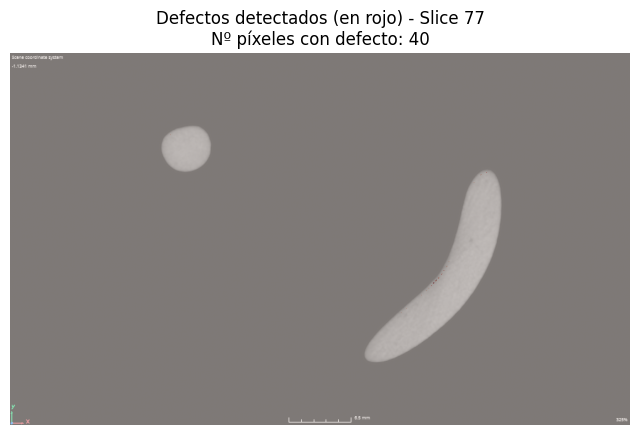

Slice 78: 35 píxeles con defecto


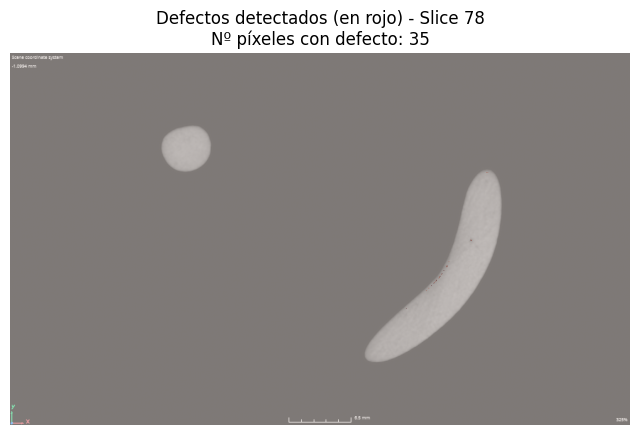

Slice 79: 45 píxeles con defecto


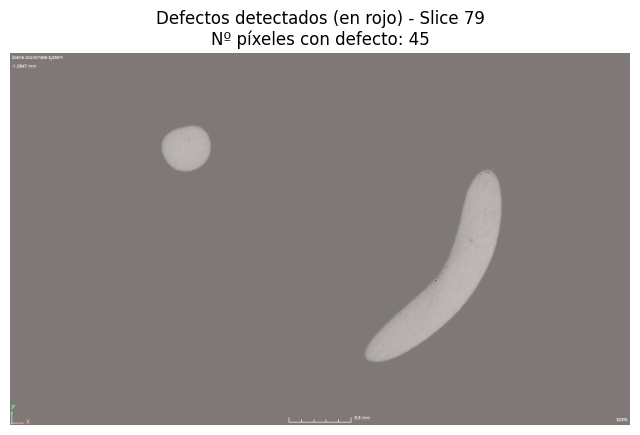

Slice 80: 33 píxeles con defecto


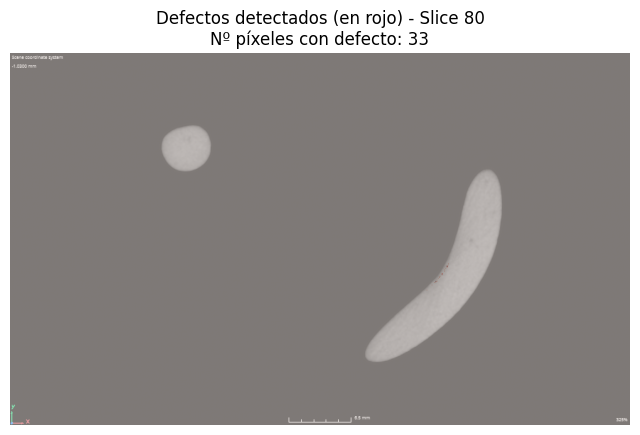

Slice 81: 72 píxeles con defecto


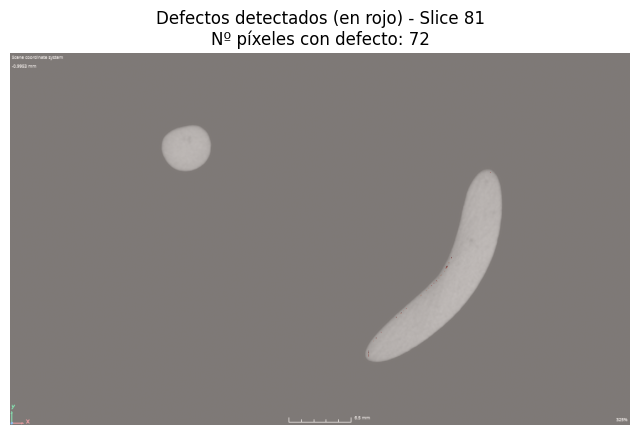

Slice 82: 57 píxeles con defecto


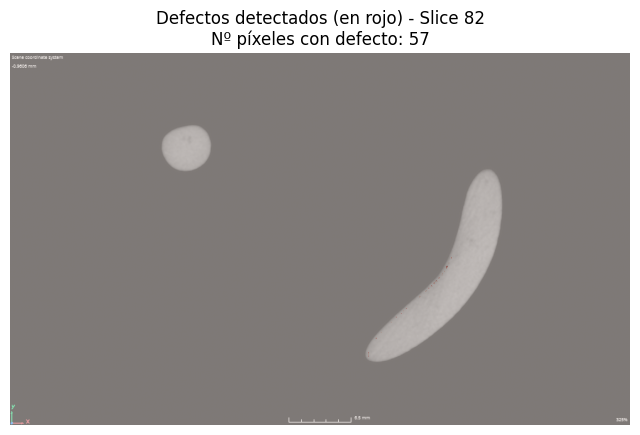

Slice 83: 88 píxeles con defecto


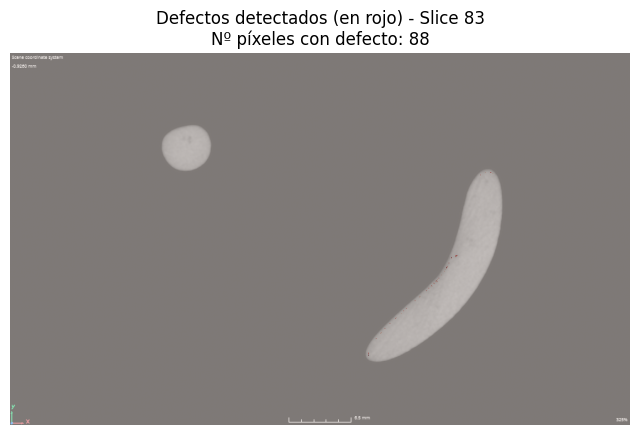

Slice 84: 85 píxeles con defecto


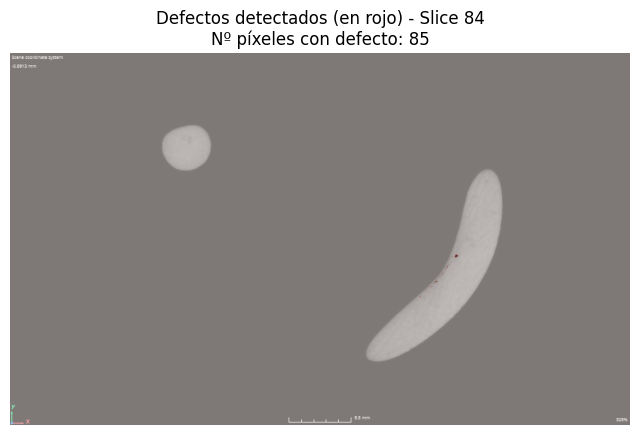

Slice 85: 115 píxeles con defecto


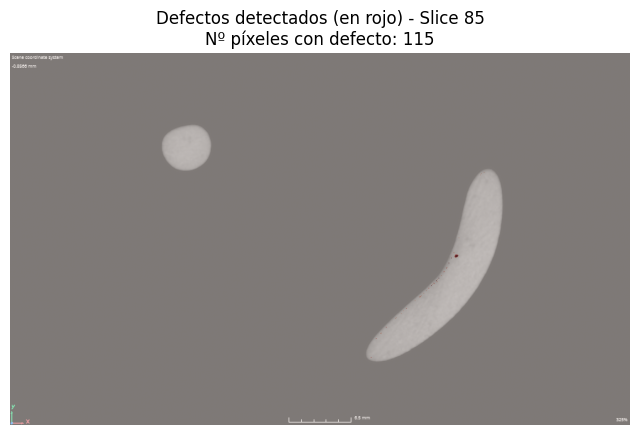

Slice 86: 91 píxeles con defecto


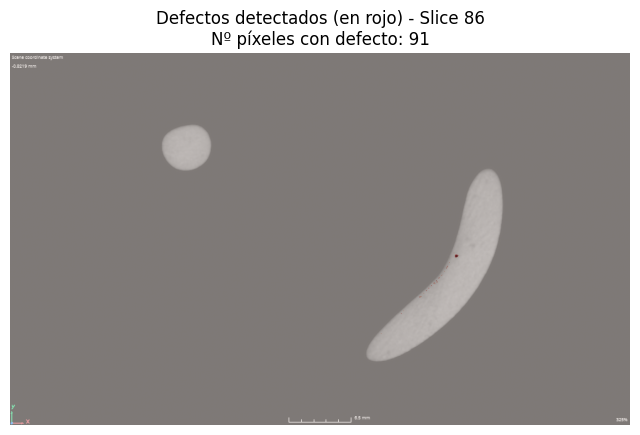

Slice 87: 73 píxeles con defecto


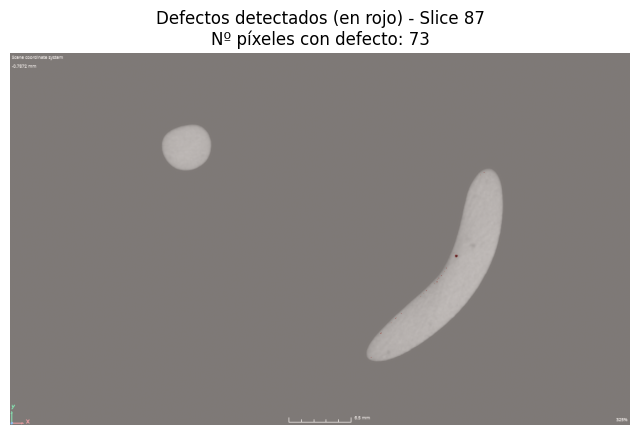

Slice 88: 72 píxeles con defecto


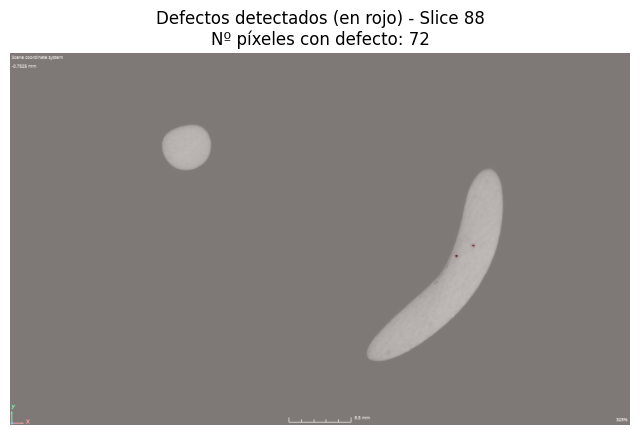

Slice 89: 89 píxeles con defecto


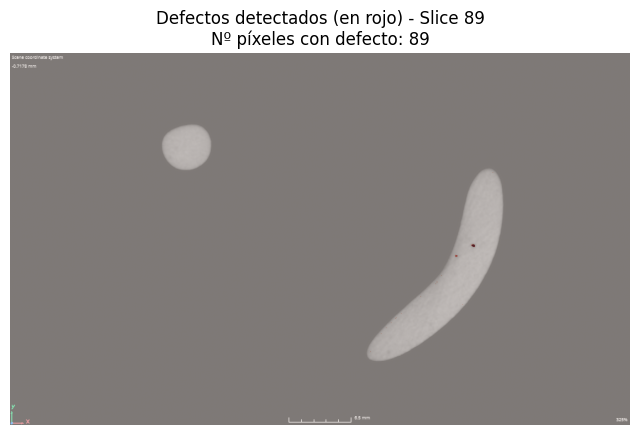

Slice 90: 73 píxeles con defecto


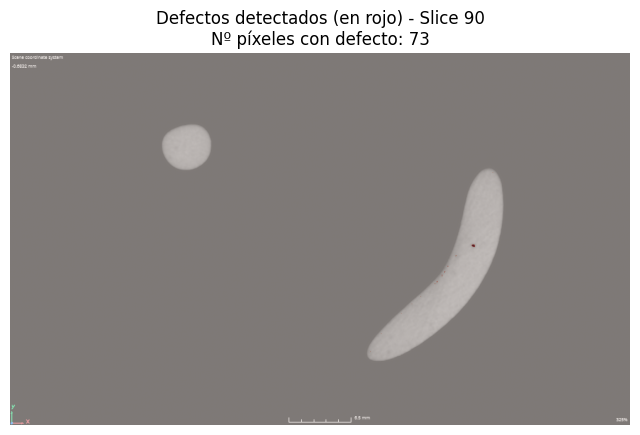

Slice 91: 33 píxeles con defecto


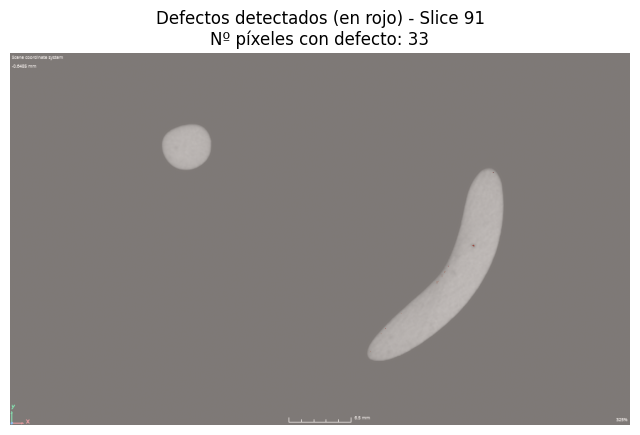

Slice 92: 36 píxeles con defecto


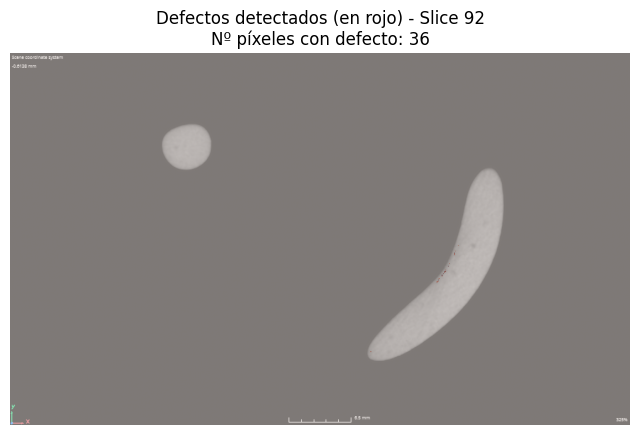

Slice 93: 22 píxeles con defecto


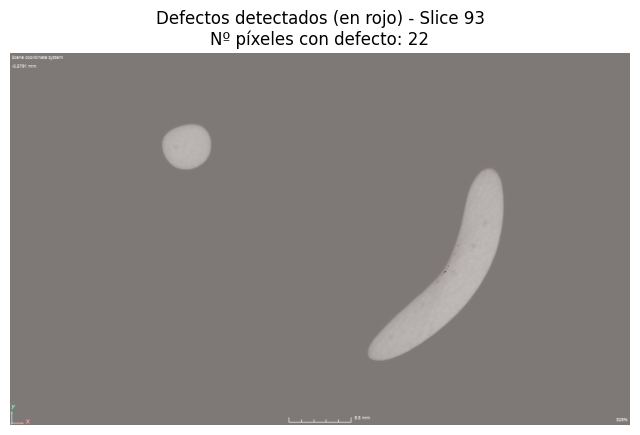

Slice 94: 44 píxeles con defecto


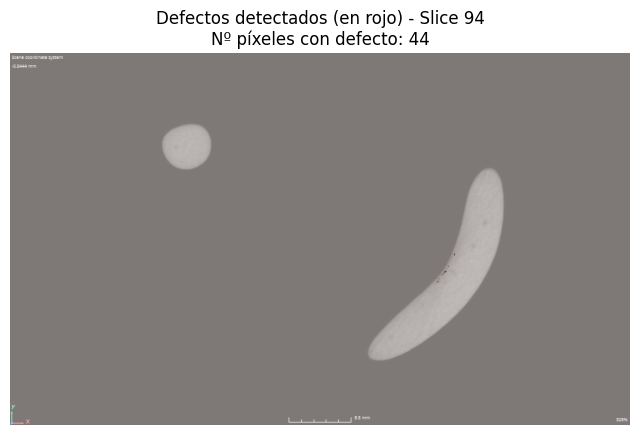

Slice 95: 52 píxeles con defecto


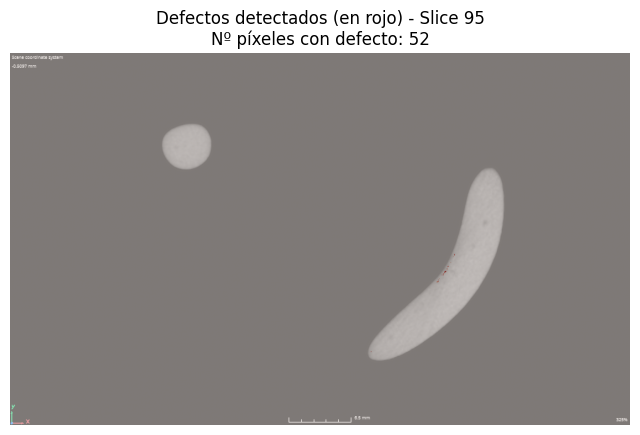

In [ ]:
import numpy as np
from scipy.ndimage import binary_erosion
import matplotlib.pyplot as plt

# --- Parámetros ---
umbral = 0.185         # Umbralde error para considerar un píxel como defecto
umbral_pieza = 0.1     # Umbral para los píxeles de la pieza
iterations = 5         # Iteraciones de erosión para eliminar borde

# --- Máscara de defecto ---
mascara_defecto = (error_map > umbral).float()

# --- Máscara de la pieza y erosión ---
mask_pieza = (input_def.cpu().sum(dim=1, keepdim=True) > umbral_pieza).float()
mask_np = mask_pieza.numpy().astype(bool)
mask_eroded = np.zeros_like(mask_np)
for b in range(mask_np.shape[0]):
    for d in range(mask_np.shape[2]):
        mask_eroded[b, 0, d] = binary_erosion(mask_np[b, 0, d], iterations=iterations)
mask_eroded = torch.tensor(mask_eroded, dtype=torch.float32)

# --- Defectos solo en el interior ---
mascara_defecto_interior = mascara_defecto * mask_eroded
num_defectos_interior = mascara_defecto_interior.sum().item()
print(f"Número de píxeles con defecto (solo interior de la pieza): {num_defectos_interior}")

# --- Visualización slice a slice ---
for depth in range(mascara_defecto_interior.shape[2]):
    real_img = input_def.cpu()[0, :, depth].permute(1, 2, 0).numpy()
    defectos_slice = mascara_defecto_interior[0, :, depth].sum(dim=0).cpu()
    num_defectos_slice = defectos_slice.sum().item()
    print(f"Slice {depth}: {int(num_defectos_slice)} píxeles con defecto")
    plt.figure(figsize=(8, 8))
    plt.imshow(real_img, cmap='gray')
    plt.imshow(defectos_slice, cmap='Reds', alpha=0.5)
    plt.title(f"Defectos detectados (en rojo) - Slice {depth}\nNº píxeles con defecto: {int(num_defectos_slice)}")
    plt.axis('off')
    plt.show()

Número de píxeles con defecto (solo interior de la pieza): 2356.0
Slice 0: 216 píxeles con defecto


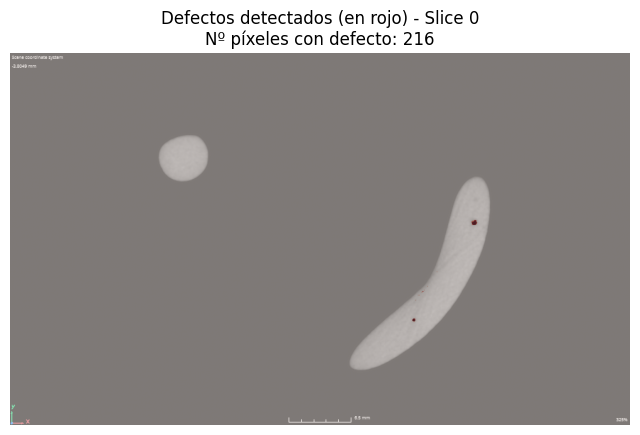

Slice 1: 167 píxeles con defecto


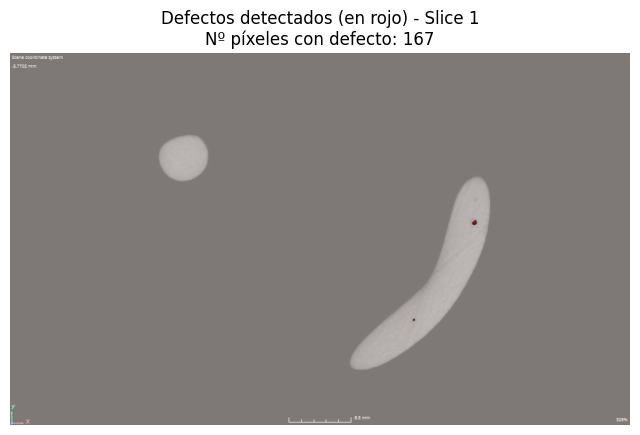

Slice 2: 73 píxeles con defecto


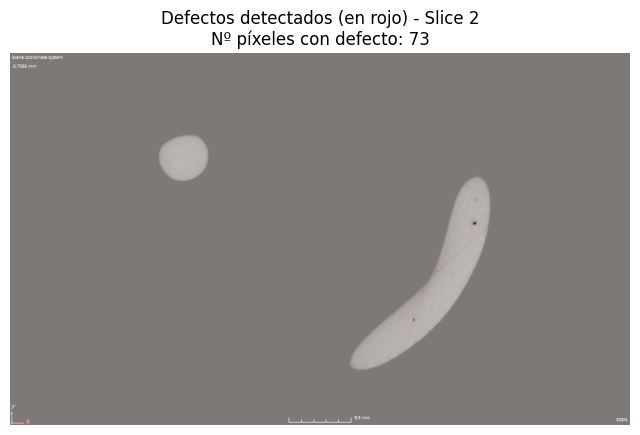

Slice 3: 2 píxeles con defecto


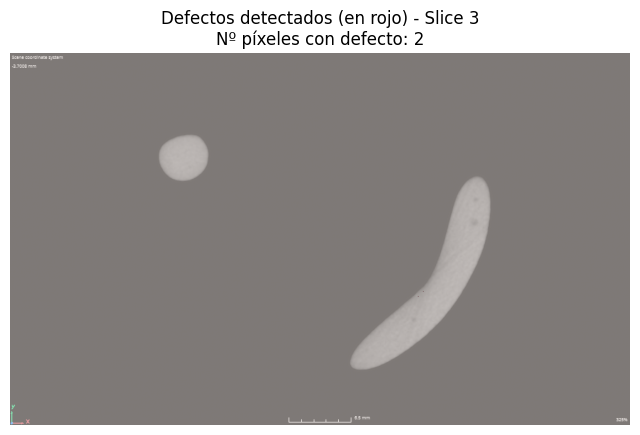

Slice 4: 12 píxeles con defecto


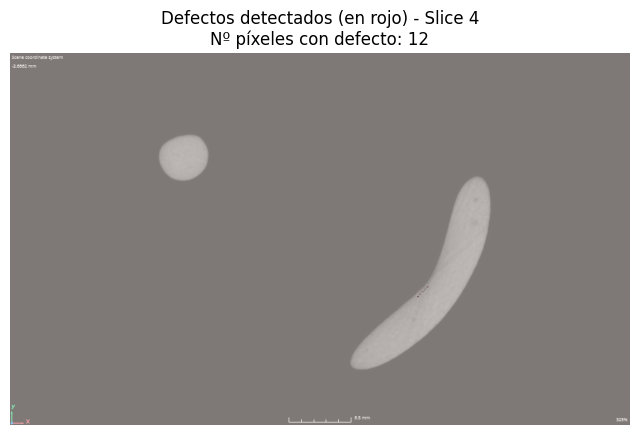

Slice 5: 2 píxeles con defecto


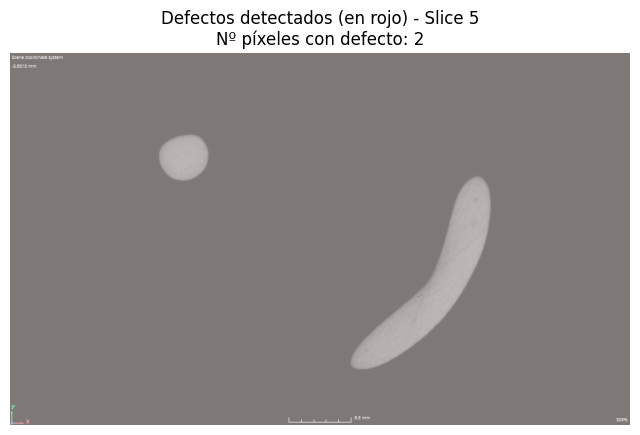

Slice 6: 5 píxeles con defecto


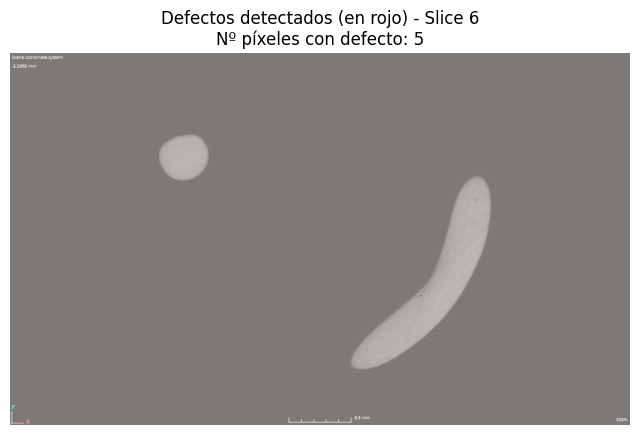

Slice 7: 2 píxeles con defecto


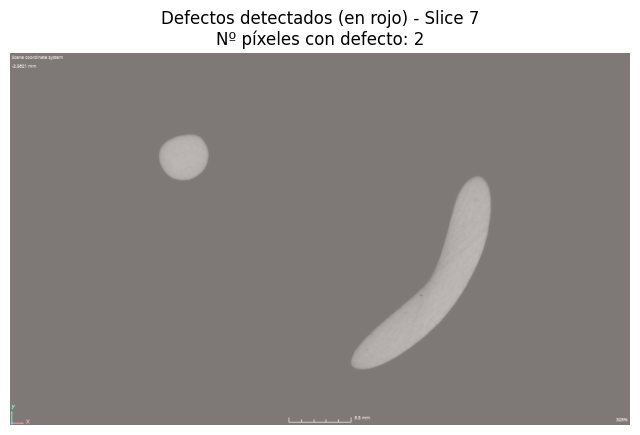

Slice 8: 10 píxeles con defecto


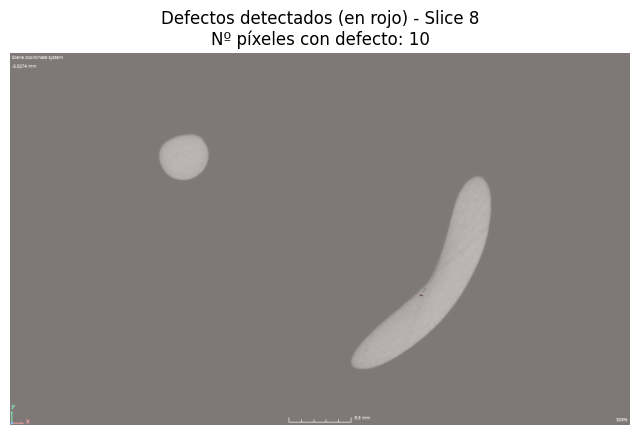

Slice 9: 8 píxeles con defecto


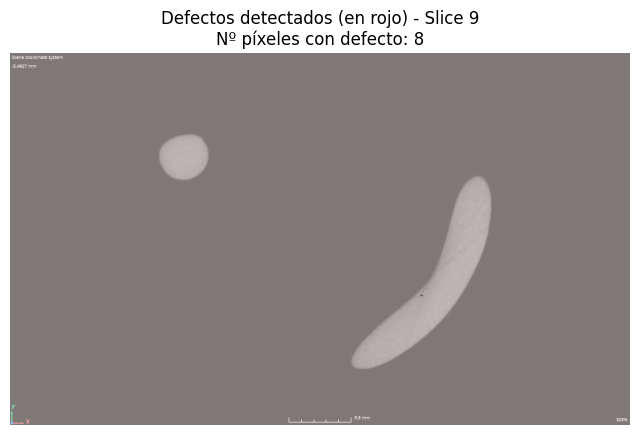

Slice 10: 13 píxeles con defecto


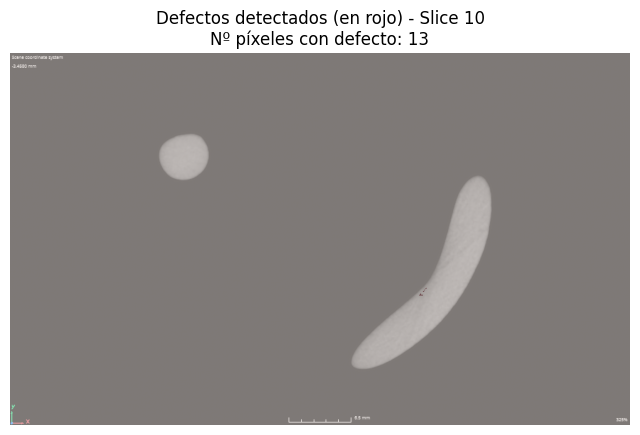

Slice 11: 14 píxeles con defecto


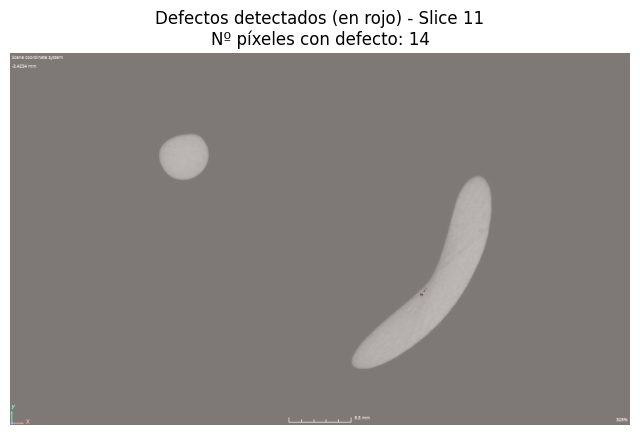

Slice 12: 29 píxeles con defecto


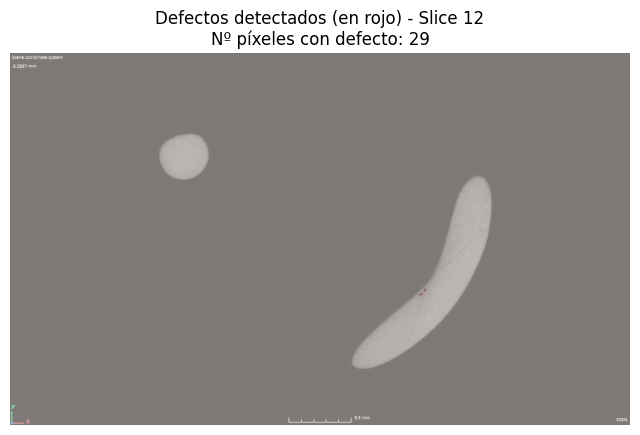

Slice 13: 5 píxeles con defecto


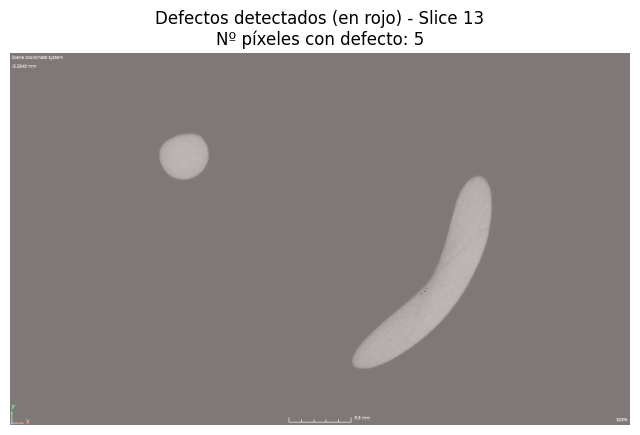

Slice 14: 5 píxeles con defecto


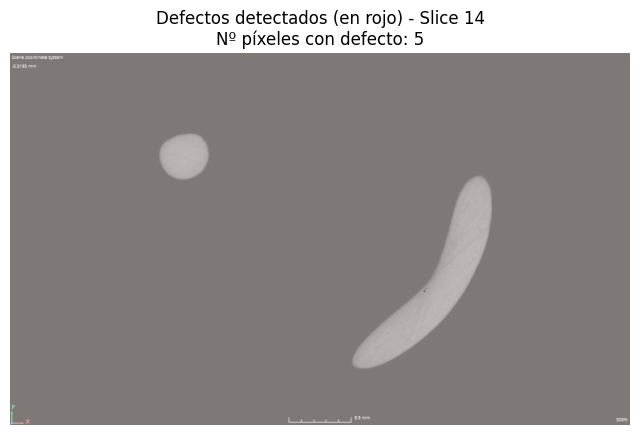

Slice 15: 2 píxeles con defecto


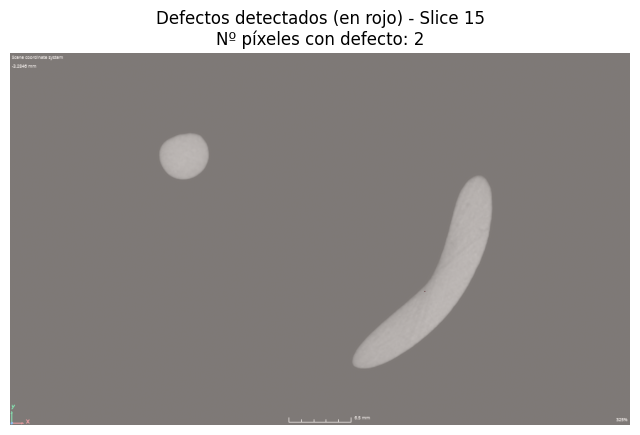

Slice 16: 9 píxeles con defecto


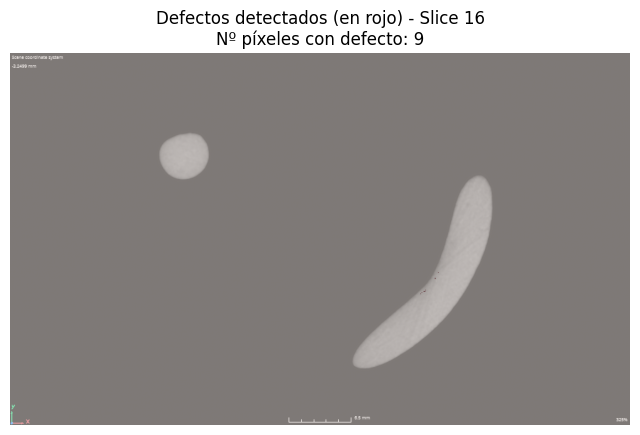

Slice 17: 3 píxeles con defecto


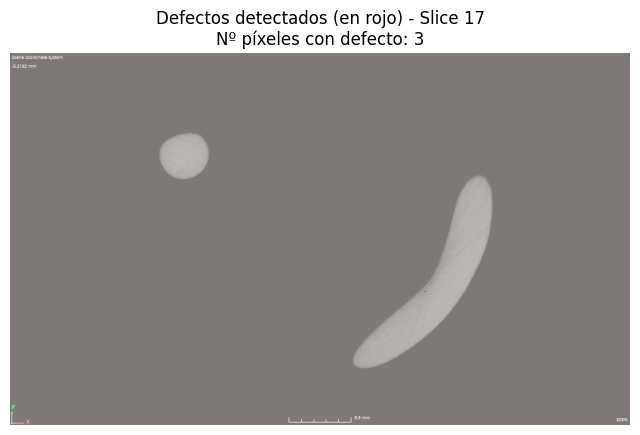

Slice 18: 10 píxeles con defecto


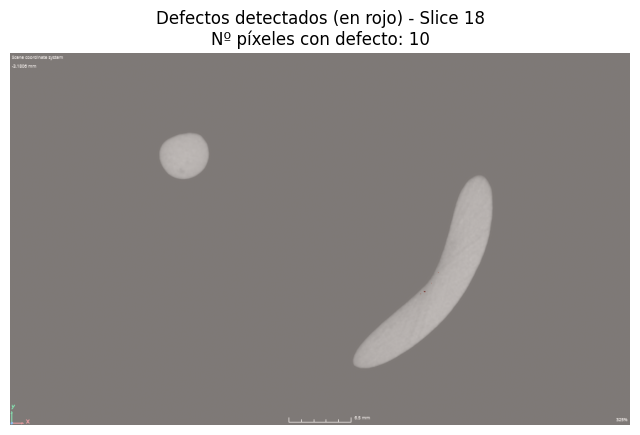

Slice 19: 9 píxeles con defecto


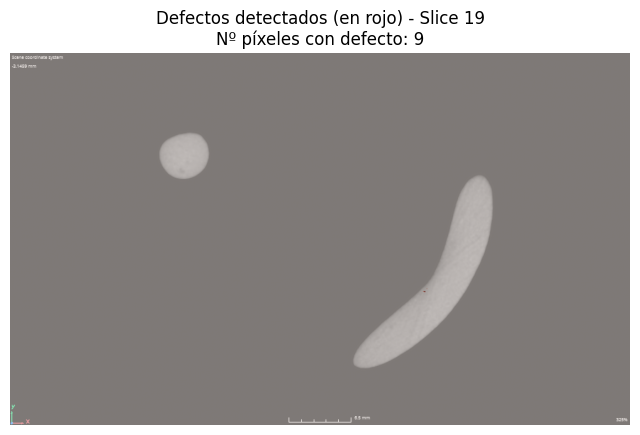

Slice 20: 19 píxeles con defecto


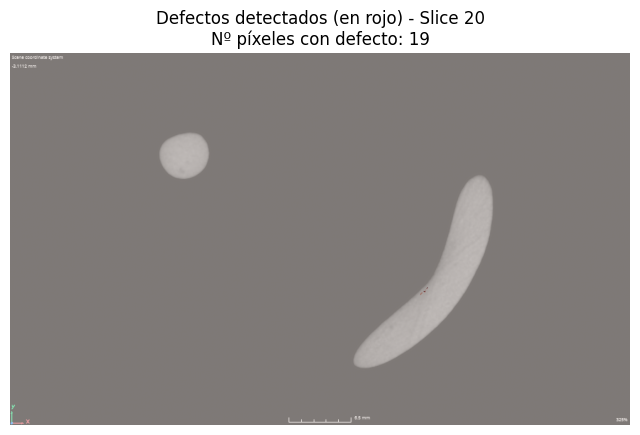

Slice 21: 14 píxeles con defecto


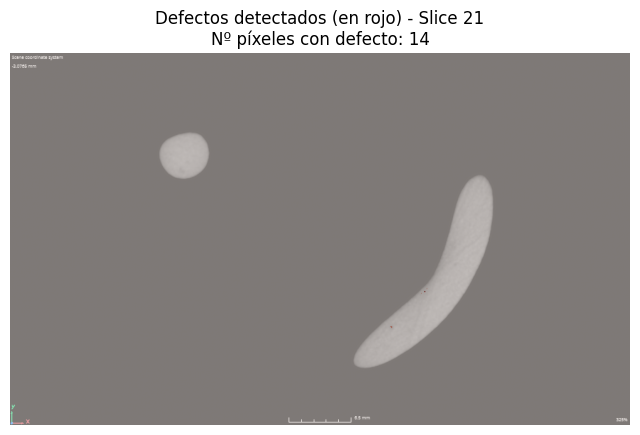

Slice 22: 16 píxeles con defecto


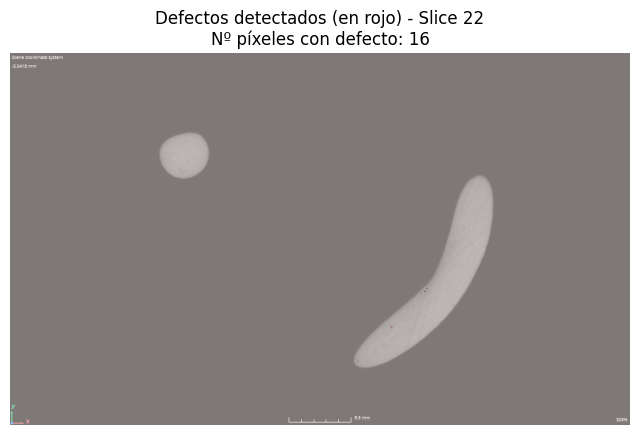

Slice 23: 8 píxeles con defecto


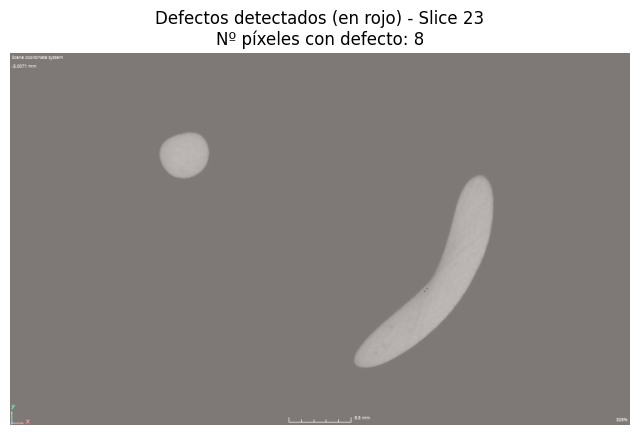

Slice 24: 14 píxeles con defecto


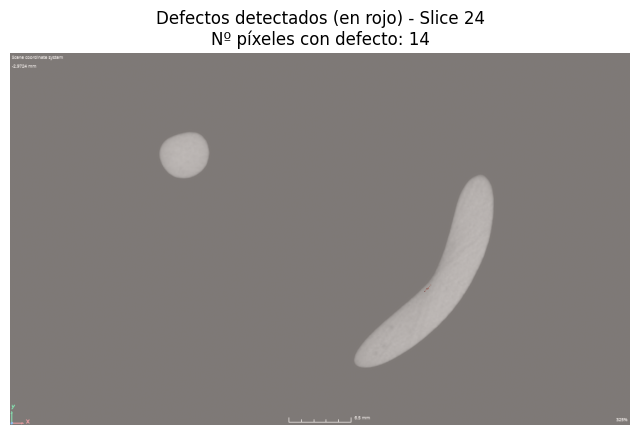

Slice 25: 8 píxeles con defecto


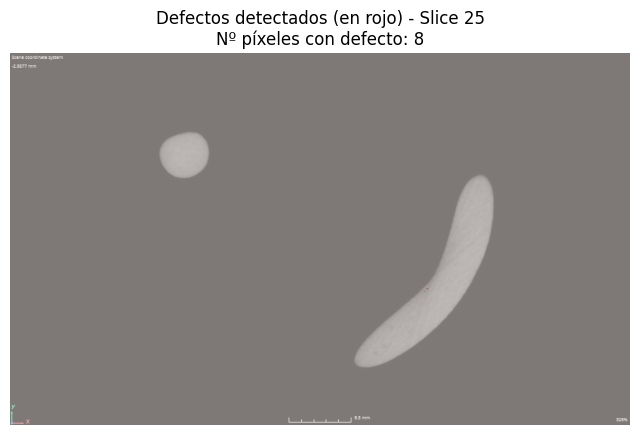

Slice 26: 10 píxeles con defecto


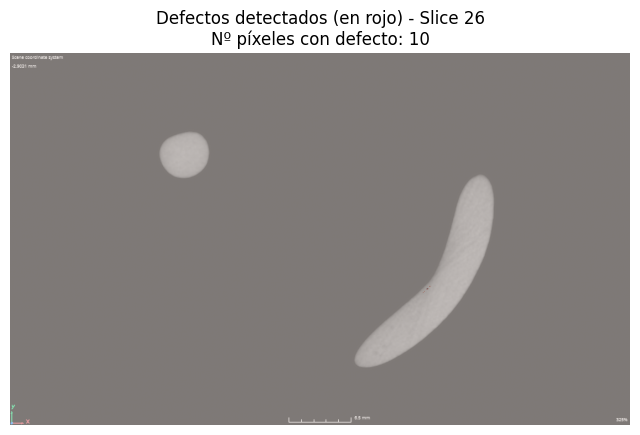

Slice 27: 9 píxeles con defecto


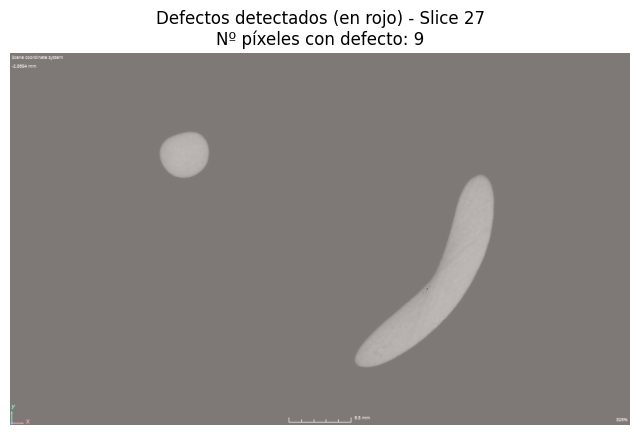

Slice 28: 22 píxeles con defecto


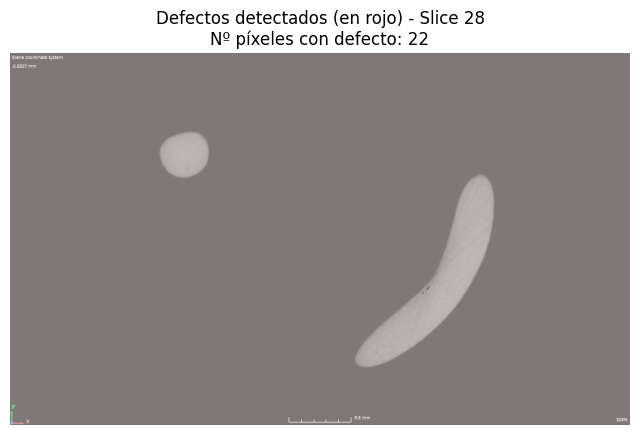

Slice 29: 12 píxeles con defecto


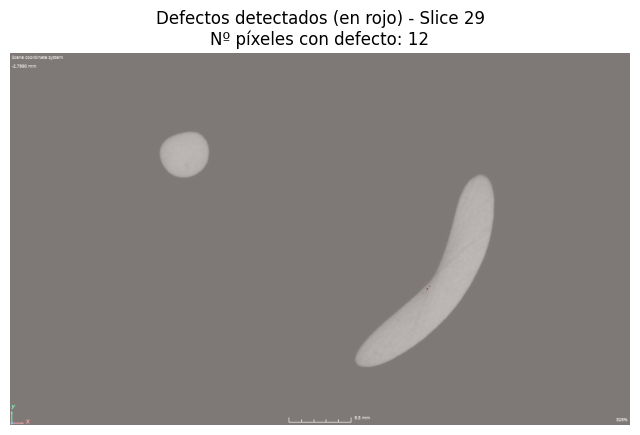

Slice 30: 15 píxeles con defecto


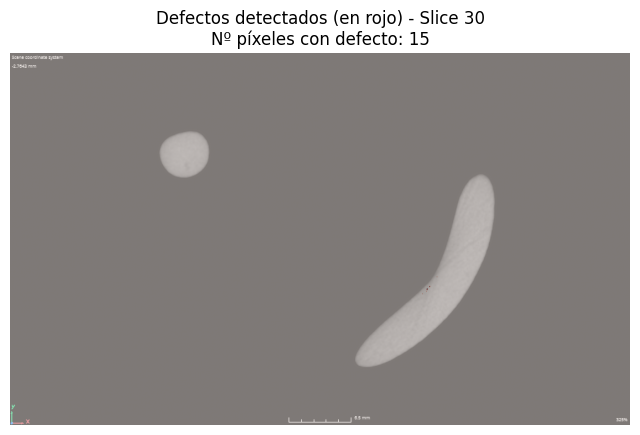

Slice 31: 12 píxeles con defecto


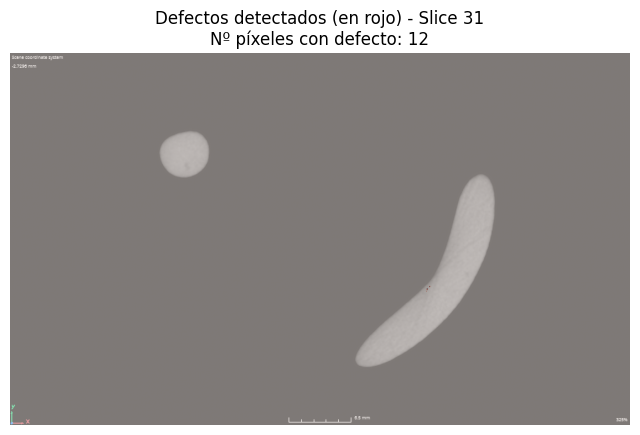

Slice 32: 19 píxeles con defecto


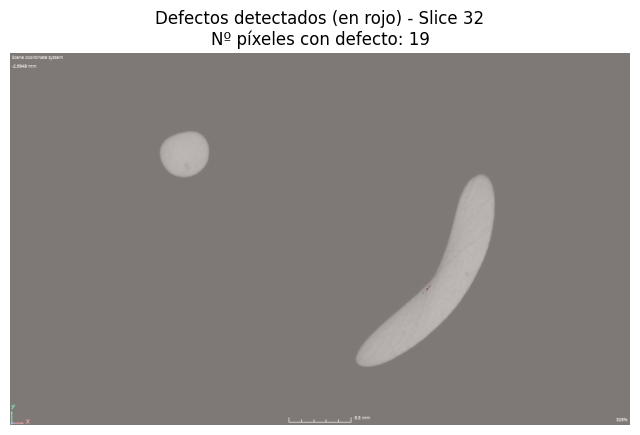

Slice 33: 14 píxeles con defecto


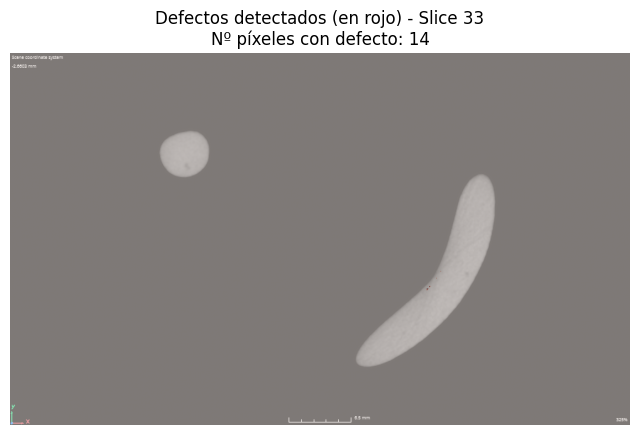

Slice 34: 25 píxeles con defecto


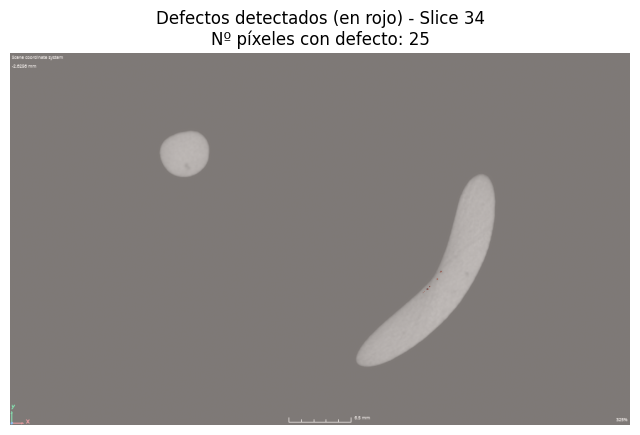

Slice 35: 48 píxeles con defecto


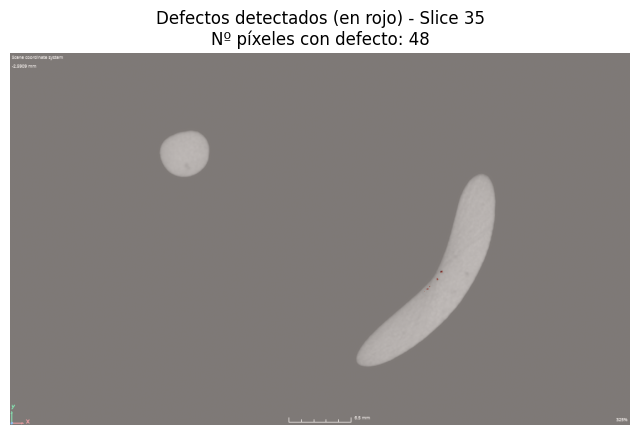

Slice 36: 52 píxeles con defecto


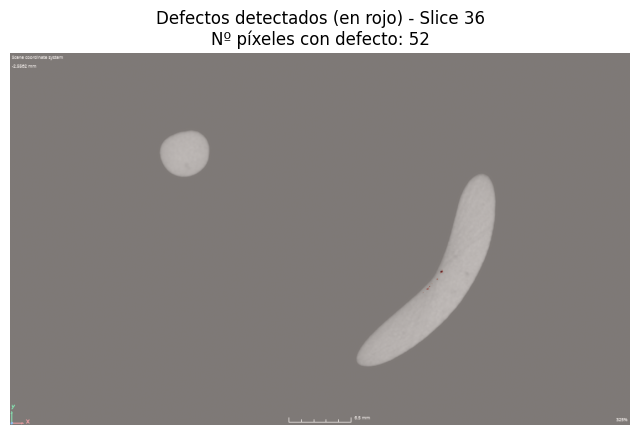

Slice 37: 35 píxeles con defecto


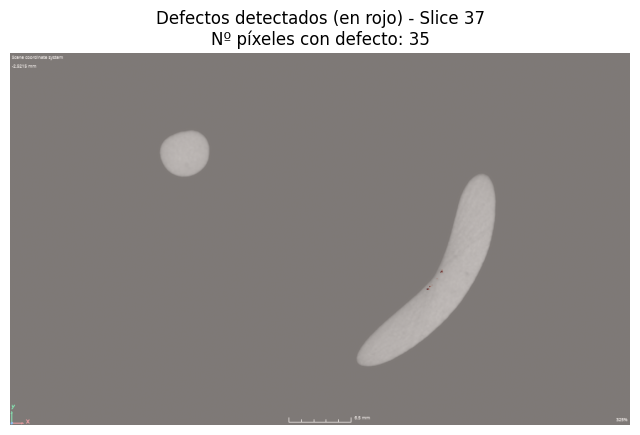

Slice 38: 43 píxeles con defecto


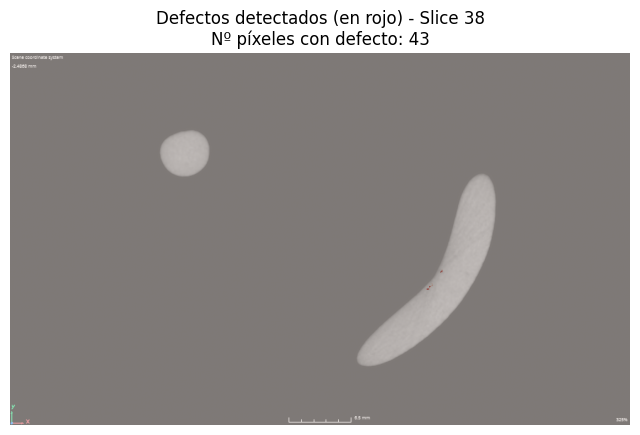

Slice 39: 29 píxeles con defecto


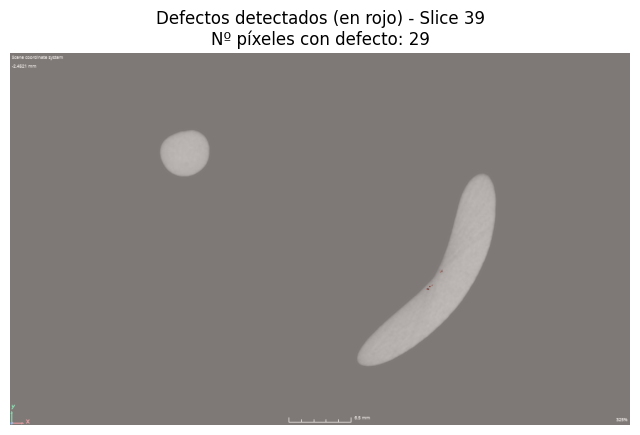

Slice 40: 27 píxeles con defecto


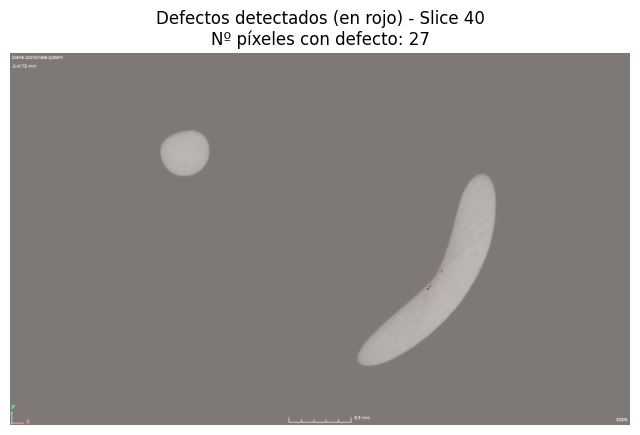

Slice 41: 14 píxeles con defecto


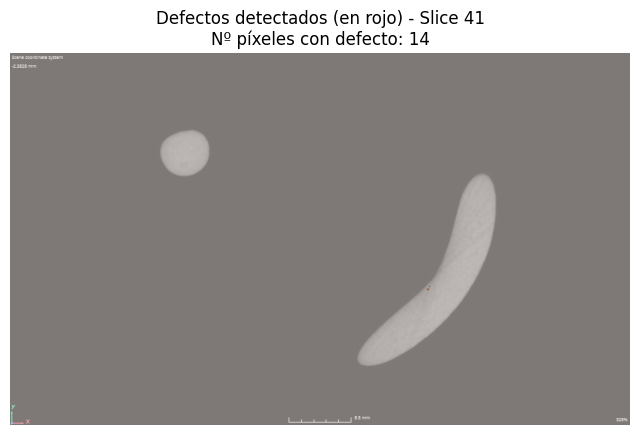

Slice 42: 14 píxeles con defecto


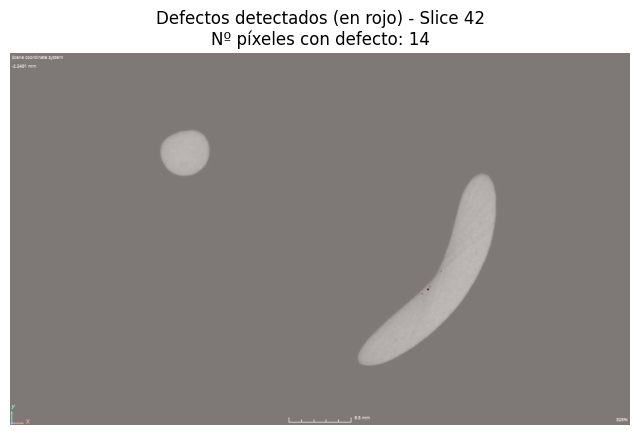

Slice 43: 9 píxeles con defecto


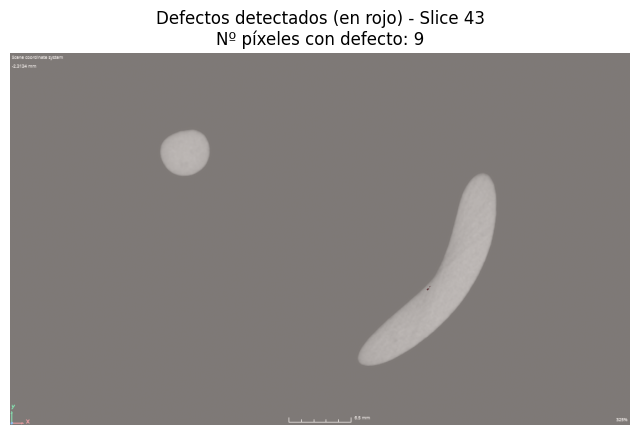

Slice 44: 9 píxeles con defecto


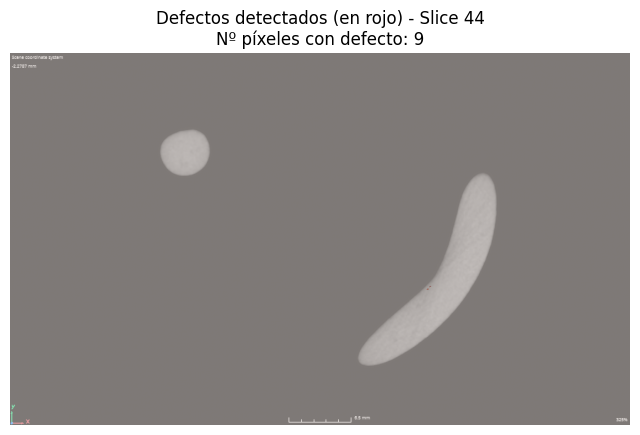

Slice 45: 7 píxeles con defecto


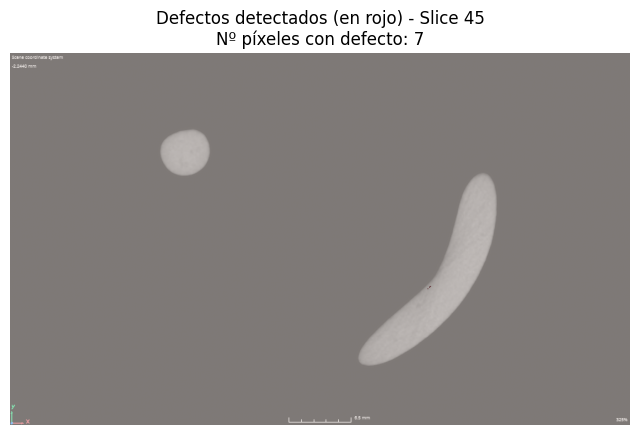

Slice 46: 8 píxeles con defecto


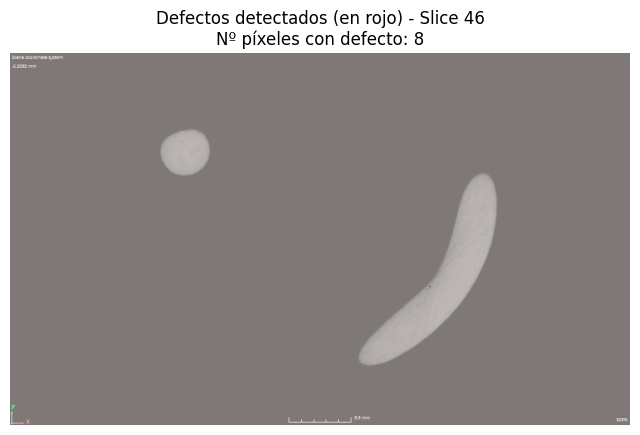

Slice 47: 12 píxeles con defecto


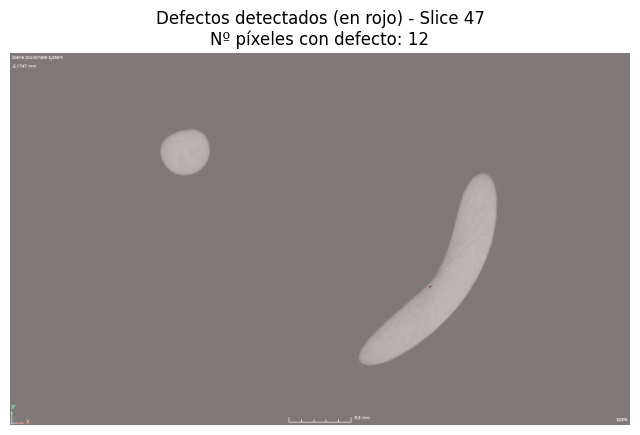

Slice 48: 20 píxeles con defecto


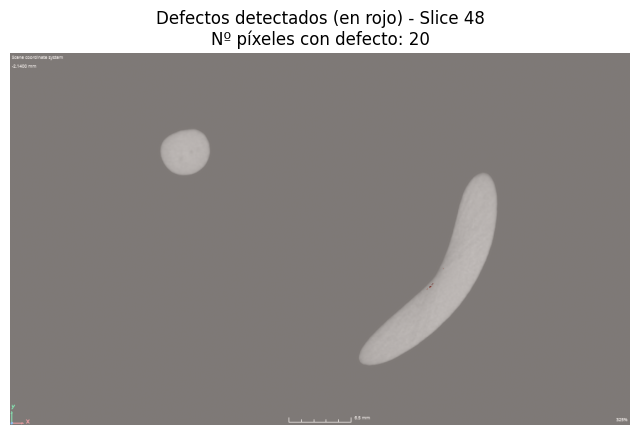

Slice 49: 26 píxeles con defecto


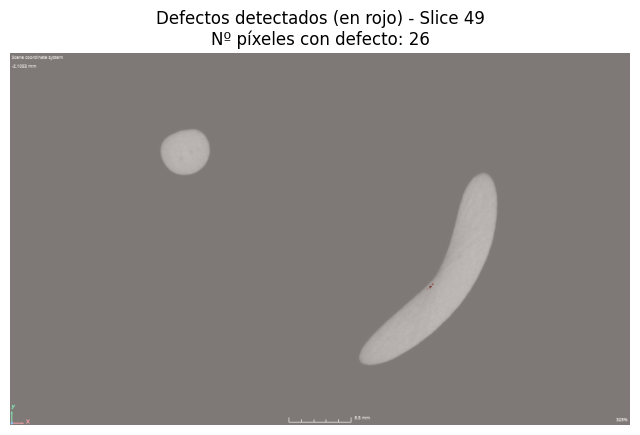

Slice 50: 27 píxeles con defecto


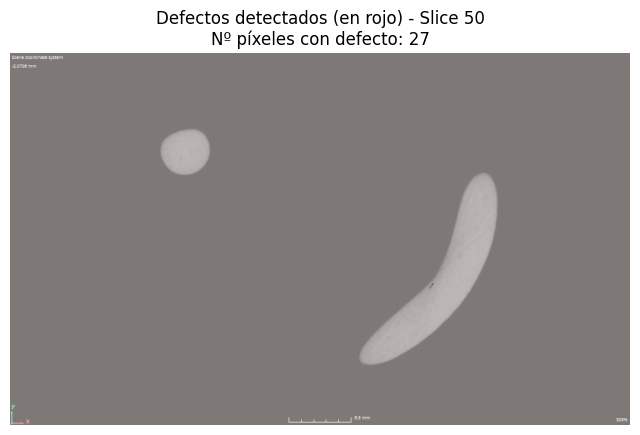

Slice 51: 21 píxeles con defecto


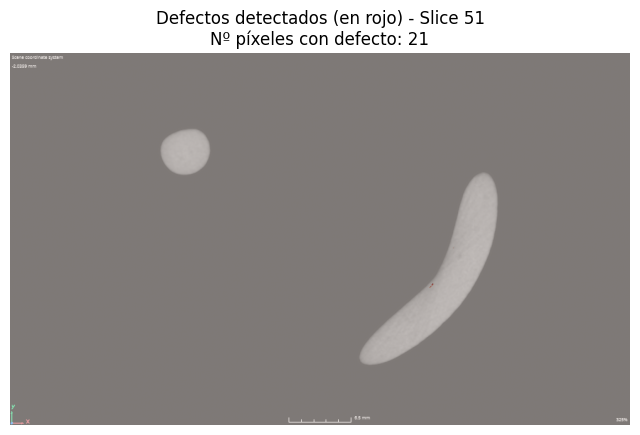

Slice 52: 17 píxeles con defecto


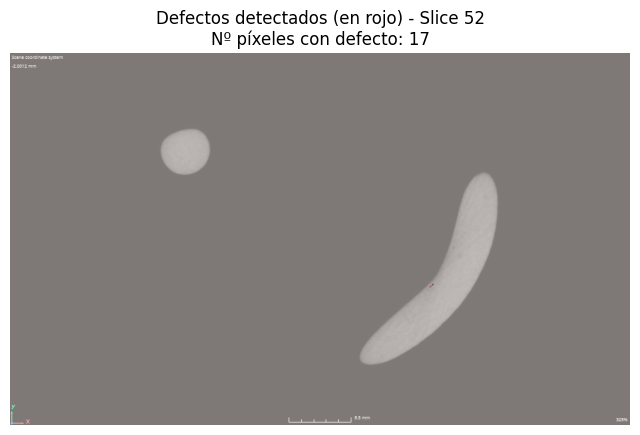

Slice 53: 7 píxeles con defecto


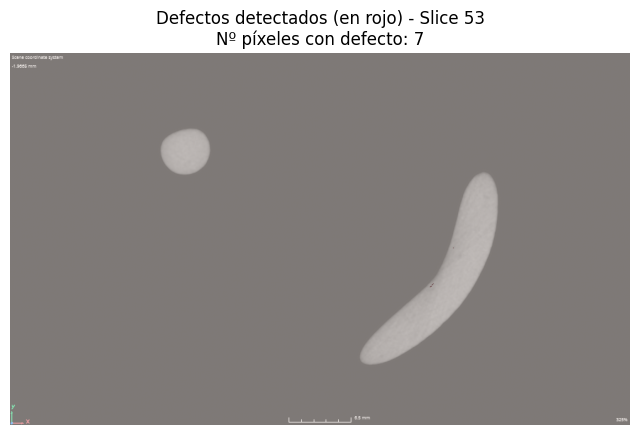

Slice 54: 11 píxeles con defecto


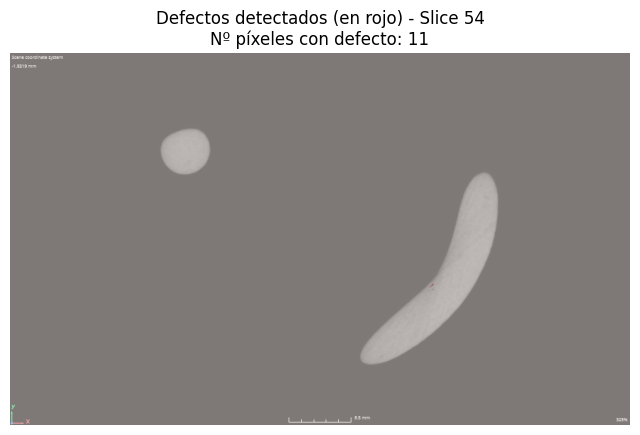

Slice 55: 8 píxeles con defecto


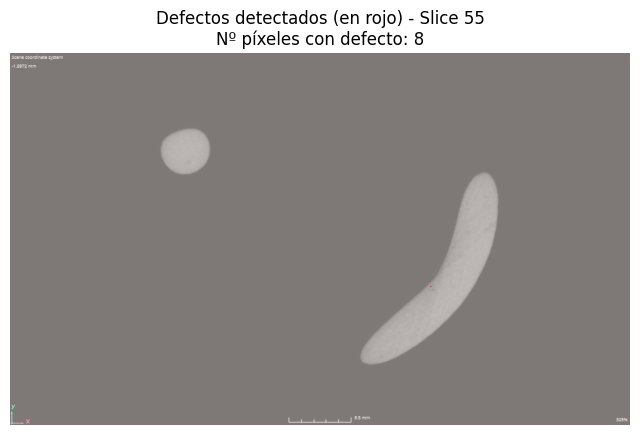

Slice 56: 13 píxeles con defecto


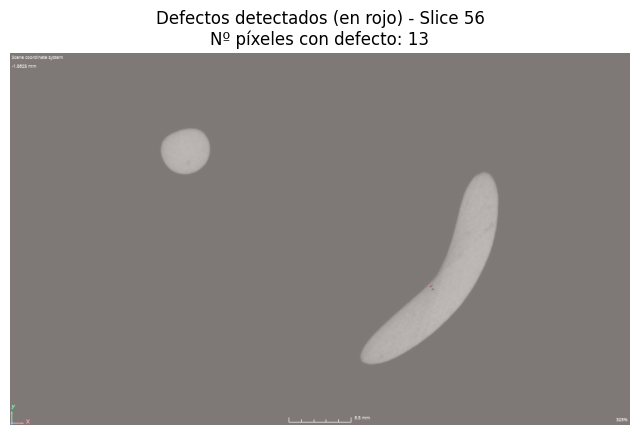

Slice 57: 17 píxeles con defecto


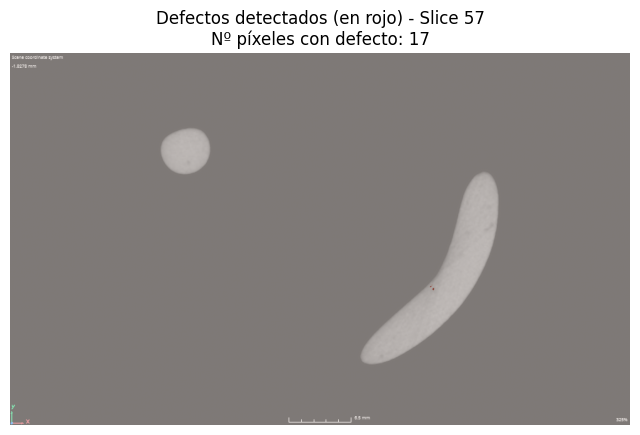

Slice 58: 11 píxeles con defecto


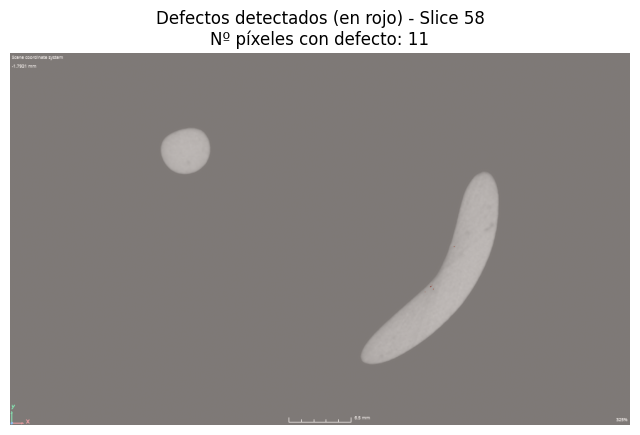

Slice 59: 7 píxeles con defecto


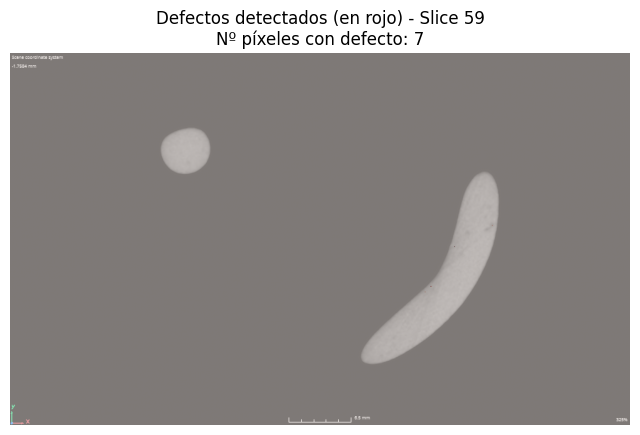

Slice 60: 10 píxeles con defecto


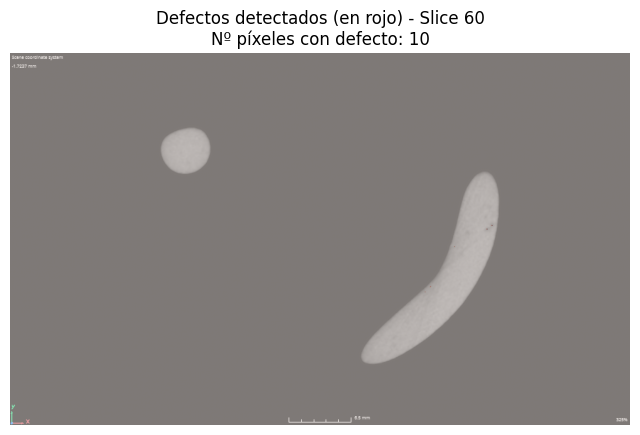

Slice 61: 5 píxeles con defecto


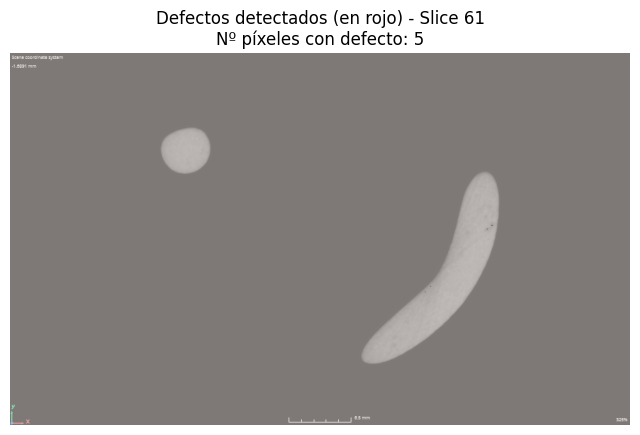

Slice 62: 1 píxeles con defecto


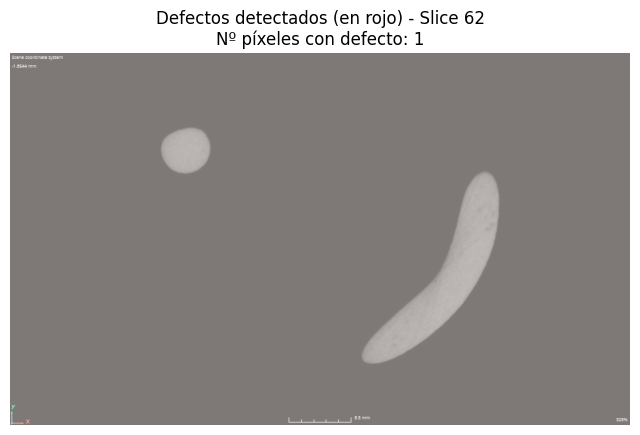

Slice 63: 0 píxeles con defecto


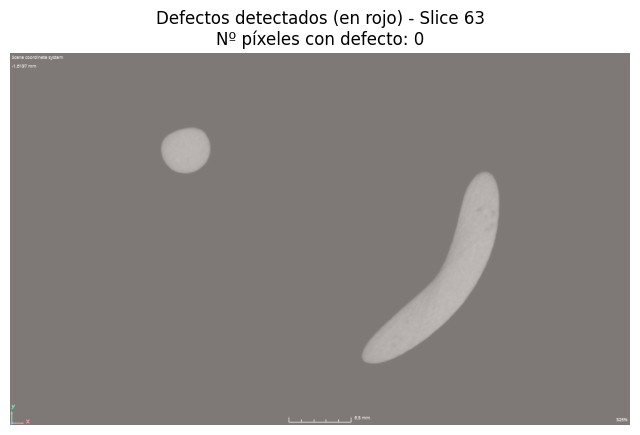

Slice 64: 20 píxeles con defecto


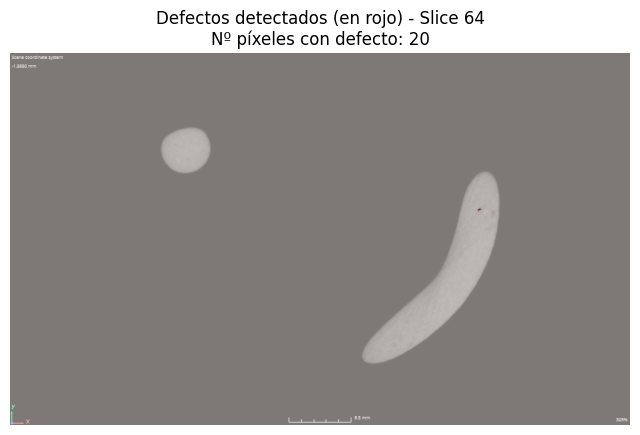

Slice 65: 57 píxeles con defecto


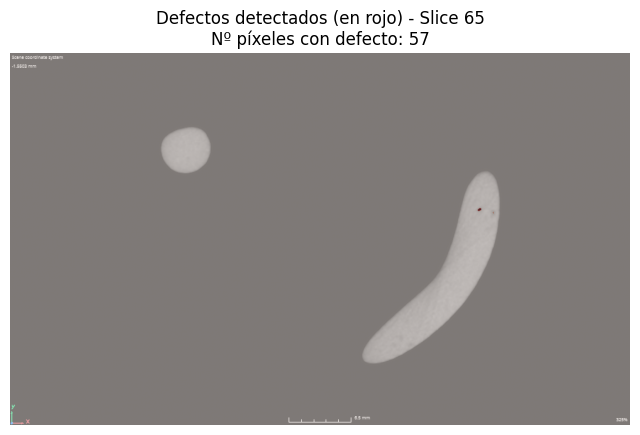

Slice 66: 75 píxeles con defecto


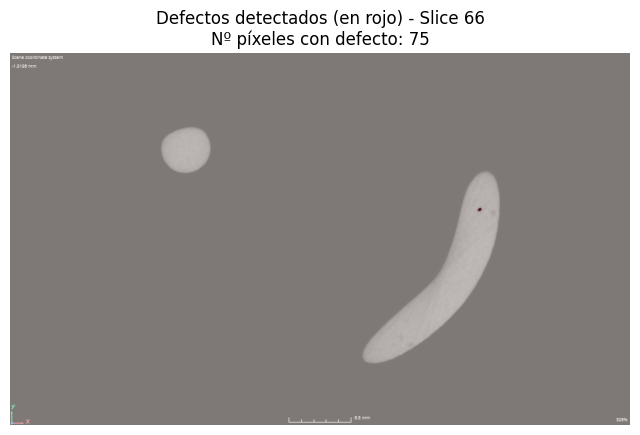

Slice 67: 98 píxeles con defecto


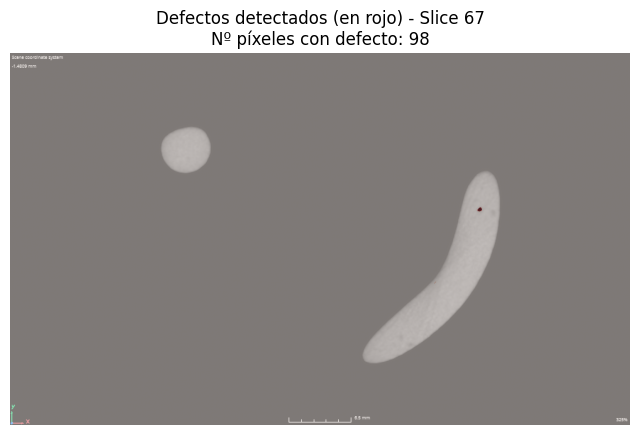

Slice 68: 110 píxeles con defecto


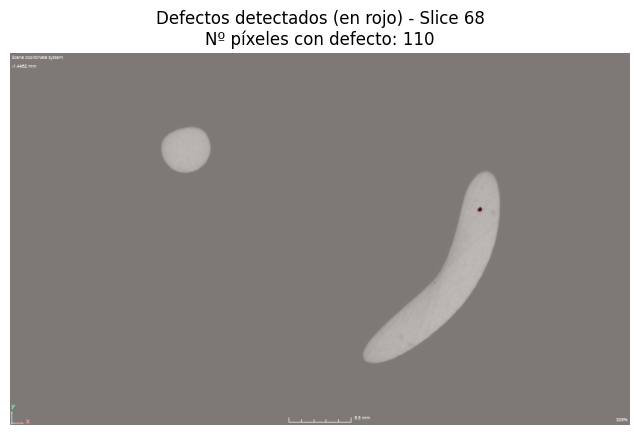

Slice 69: 78 píxeles con defecto


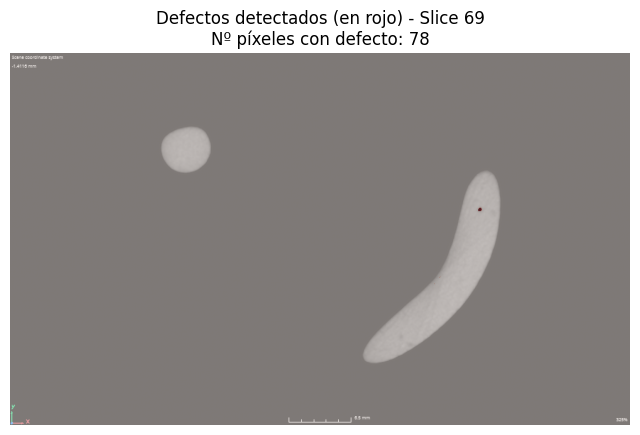

Slice 70: 32 píxeles con defecto


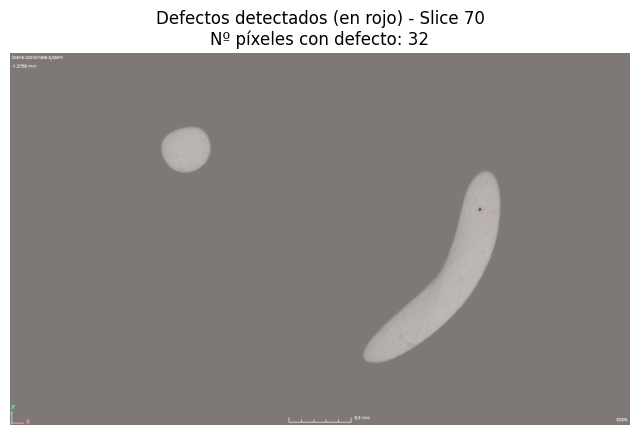

Slice 71: 2 píxeles con defecto


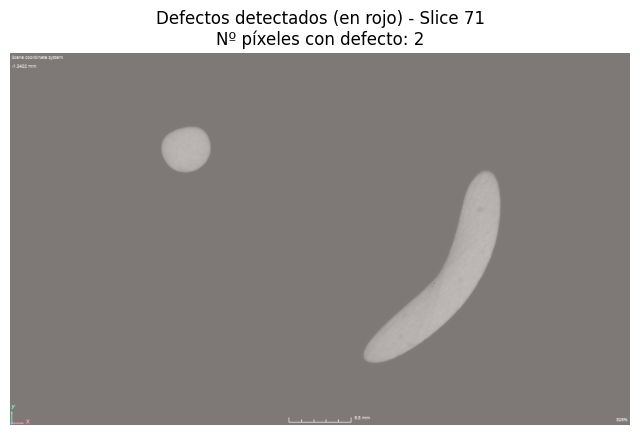

Slice 72: 9 píxeles con defecto


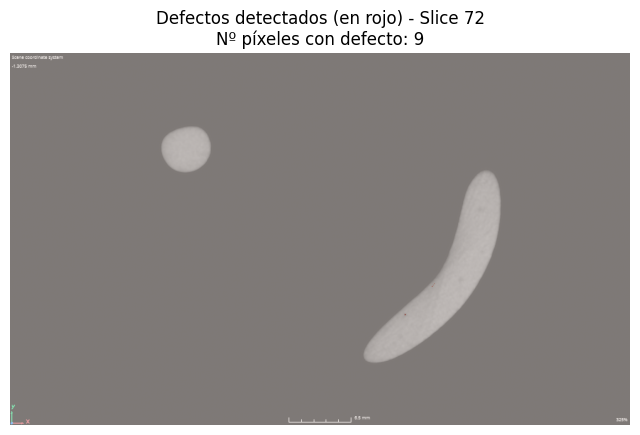

Slice 73: 27 píxeles con defecto


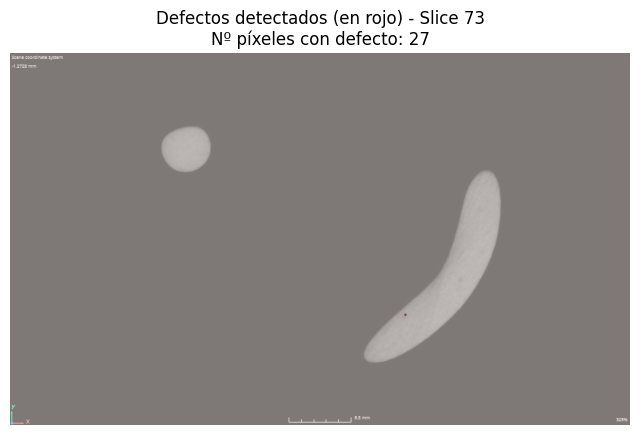

Slice 74: 38 píxeles con defecto


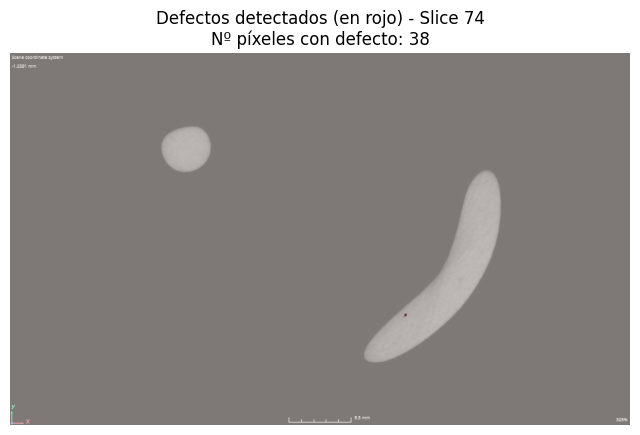

Slice 75: 16 píxeles con defecto


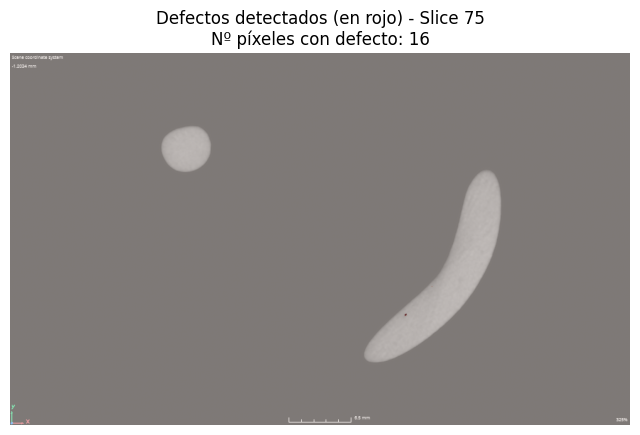

Slice 76: 11 píxeles con defecto


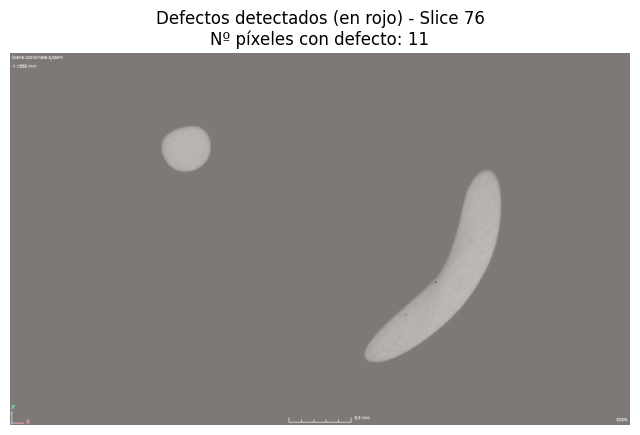

Slice 77: 0 píxeles con defecto


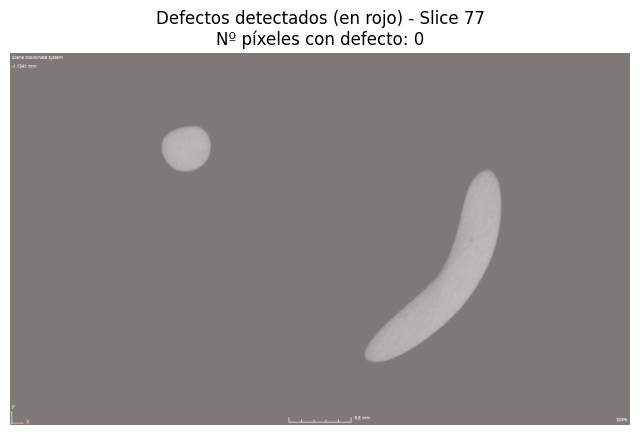

Slice 78: 4 píxeles con defecto


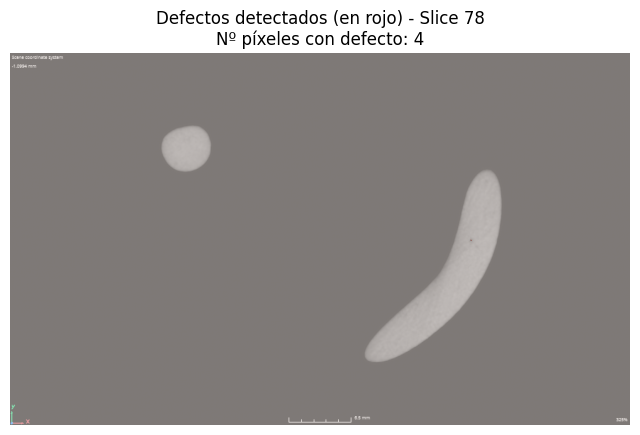

Slice 79: 1 píxeles con defecto


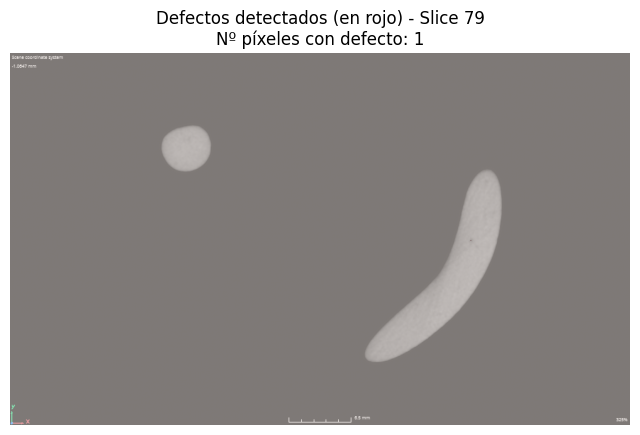

Slice 80: 2 píxeles con defecto


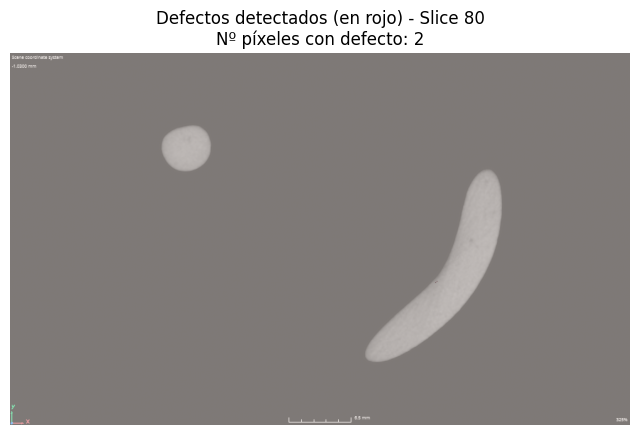

Slice 81: 1 píxeles con defecto


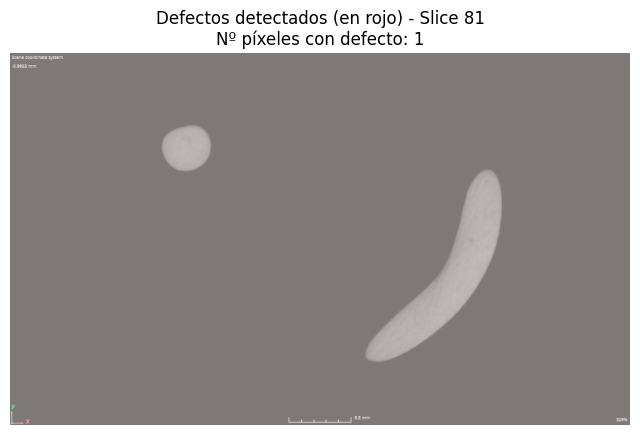

Slice 82: 3 píxeles con defecto


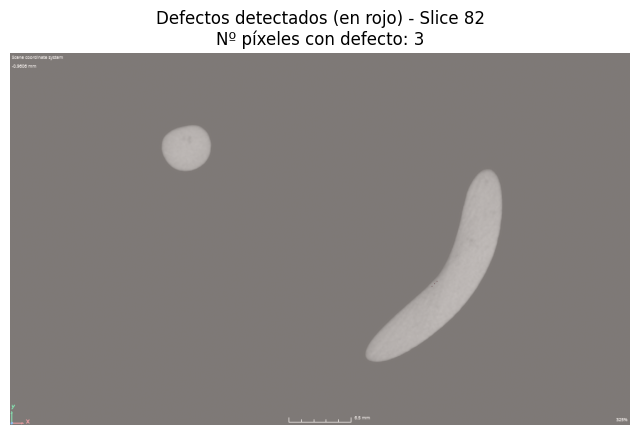

Slice 83: 16 píxeles con defecto


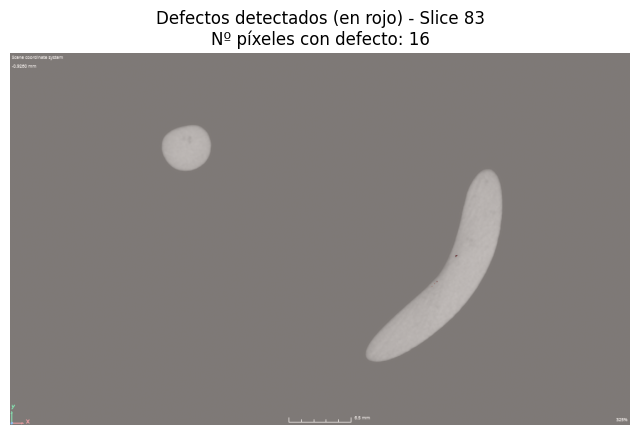

Slice 84: 48 píxeles con defecto


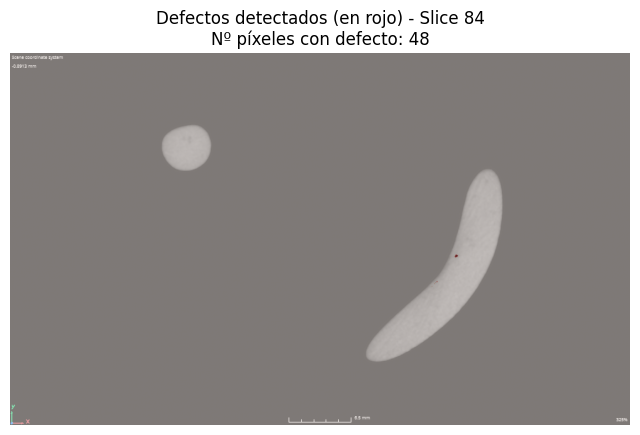

Slice 85: 58 píxeles con defecto


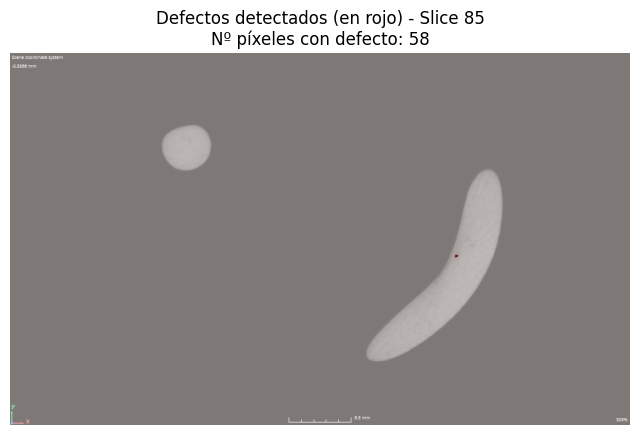

Slice 86: 55 píxeles con defecto


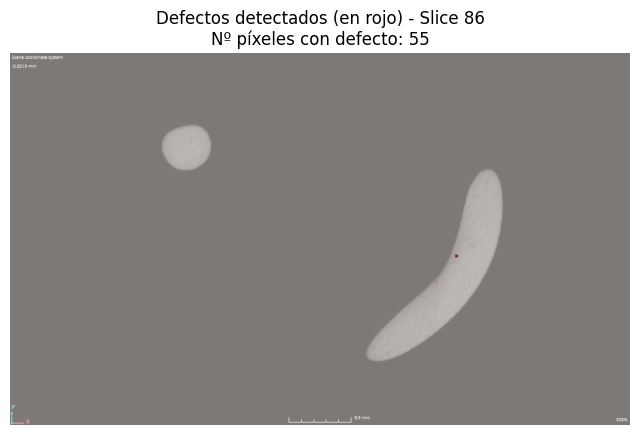

Slice 87: 41 píxeles con defecto


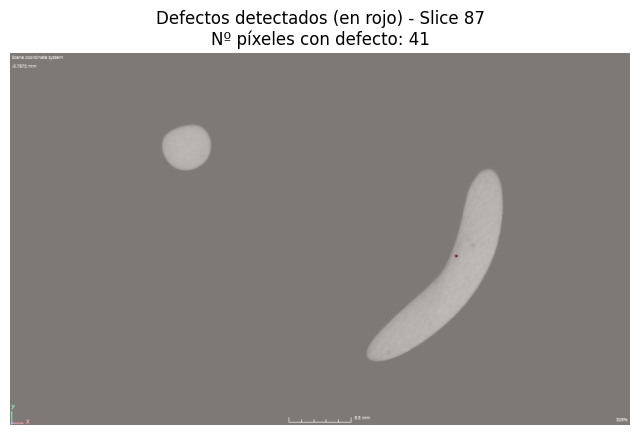

Slice 88: 57 píxeles con defecto


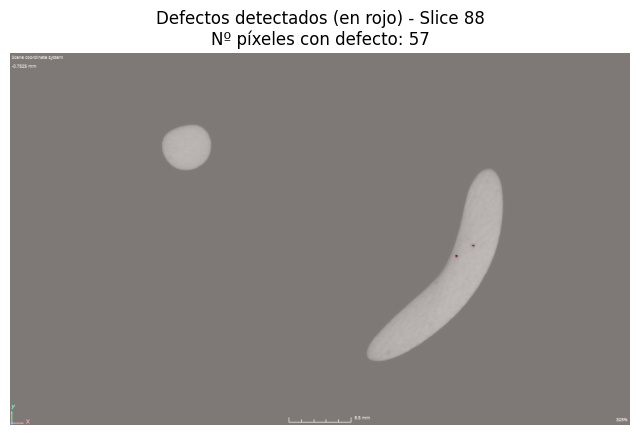

Slice 89: 77 píxeles con defecto


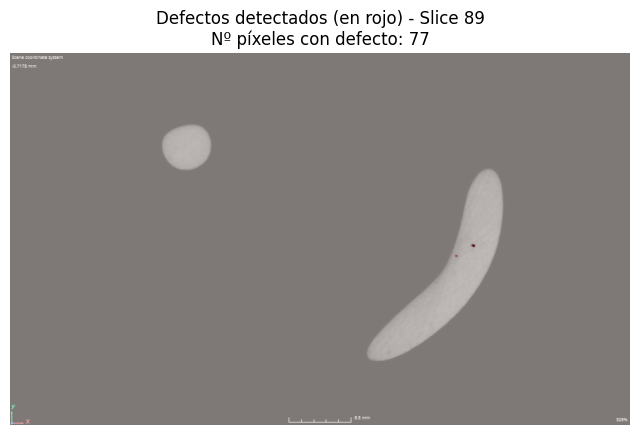

Slice 90: 54 píxeles con defecto


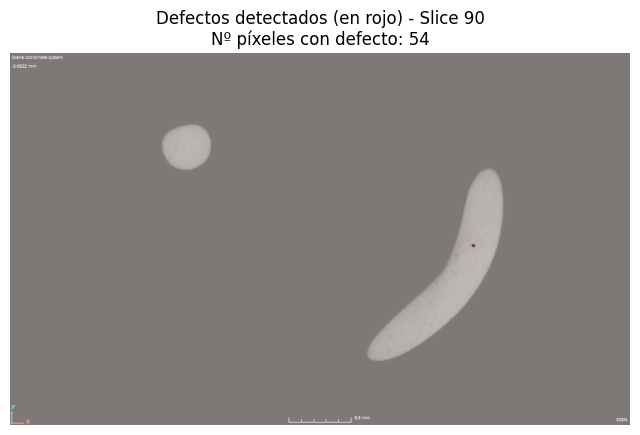

Slice 91: 17 píxeles con defecto


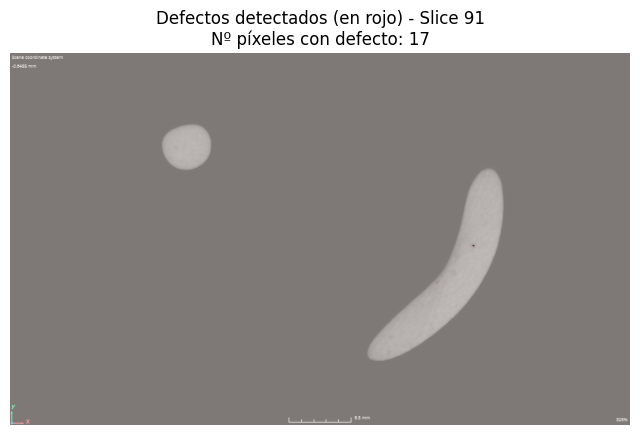

Slice 92: 4 píxeles con defecto


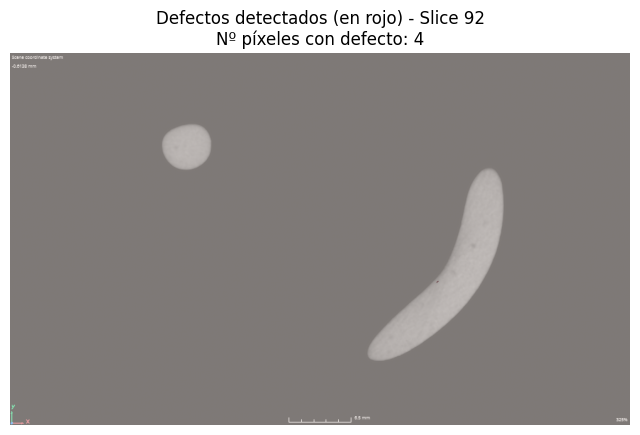

Slice 93: 3 píxeles con defecto


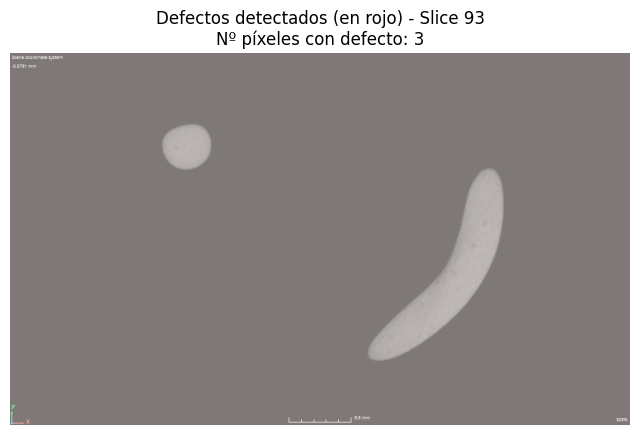

Slice 94: 9 píxeles con defecto


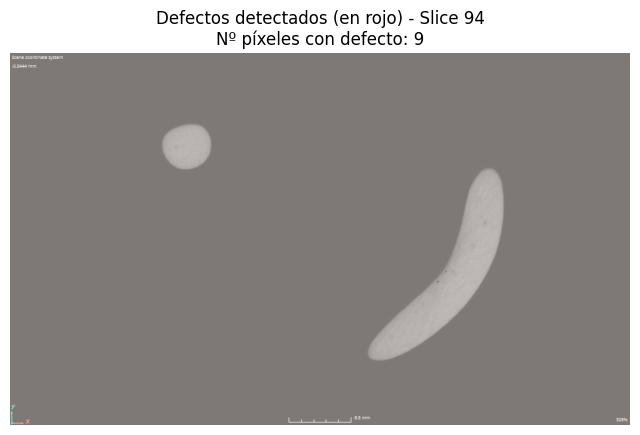

Slice 95: 12 píxeles con defecto


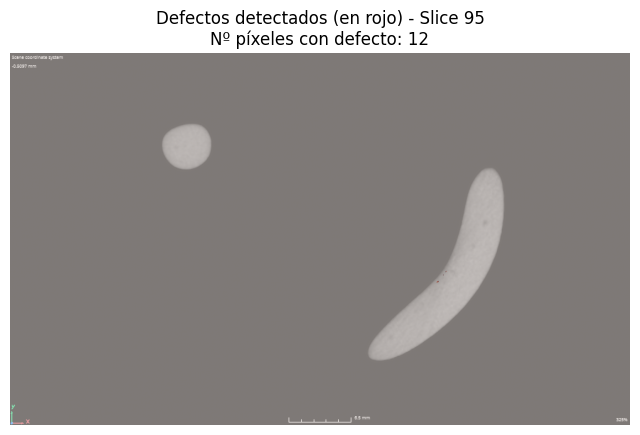

In [20]:
import numpy as np
from scipy.ndimage import binary_erosion
import matplotlib.pyplot as plt

# --- Parámetros ---
umbral = 0.185         # Umbralde error para considerar un píxel como defecto
umbral_pieza = 0.1     # Umbral para los píxeles de la pieza
iterations = 7         # Iteraciones de erosión para eliminar borde

# --- Máscara de defecto ---
mascara_defecto = (error_map > umbral).float()

# --- Máscara de la pieza y erosión ---
mask_pieza = (input_def.cpu().sum(dim=1, keepdim=True) > umbral_pieza).float()
mask_np = mask_pieza.numpy().astype(bool)
mask_eroded = np.zeros_like(mask_np)
for b in range(mask_np.shape[0]):
    for d in range(mask_np.shape[2]):
        mask_eroded[b, 0, d] = binary_erosion(mask_np[b, 0, d], iterations=iterations)
mask_eroded = torch.tensor(mask_eroded, dtype=torch.float32)

# --- Defectos solo en el interior ---
mascara_defecto_interior = mascara_defecto * mask_eroded
num_defectos_interior = mascara_defecto_interior.sum().item()
print(f"Número de píxeles con defecto (solo interior de la pieza): {num_defectos_interior}")

# --- Visualización slice a slice ---
for depth in range(mascara_defecto_interior.shape[2]):
    real_img = input_def.cpu()[0, :, depth].permute(1, 2, 0).numpy()
    defectos_slice = mascara_defecto_interior[0, :, depth].sum(dim=0).cpu()
    num_defectos_slice = defectos_slice.sum().item()
    print(f"Slice {depth}: {int(num_defectos_slice)} píxeles con defecto")
    plt.figure(figsize=(8, 8))
    plt.imshow(real_img, cmap='gray')
    plt.imshow(defectos_slice, cmap='Reds', alpha=0.5)
    plt.title(f"Defectos detectados (en rojo) - Slice {depth}\nNº píxeles con defecto: {int(num_defectos_slice)}")
    plt.axis('off')
    plt.show()

Vamos a ver como se podrían reconstruir los volúmenes.

1: Solo filtro para mínimo número de voxeles.

In [17]:
from scipy.ndimage import label

# Convierte a mm (1 pulgada = 25.4 mm)
pixel_size_x_mm = 0.0347
pixel_size_y_mm = 0.0347
slice_thickness_mm = 0.0347  # Espesor de la slice en mm


# Etiquetado 3D
defectos_np = mascara_defecto_interior.numpy().astype(np.uint8)
labeled_defects, num_defects = label(defectos_np)

# Filtrado por tamaño mínimo
min_voxels = 100  # Cambia este valor según lo que consideres ruido
volumenes = [(labeled_defects == i).sum() for i in range(1, num_defects+1)]

# Creamos una máscara solo con los defectos grandes
mask_filtrada = np.zeros_like(labeled_defects)
for i, v in enumerate(volumenes, 1):
    if v >= min_voxels:
        mask_filtrada[labeled_defects == i] = i  # O usa 1 si solo quieres binario

# Ahora puedes volver a contar y mostrar solo los defectos filtrados
defectos_filtrados = np.unique(mask_filtrada)[1:]  # Excluye el 0 (fondo)

# Calcula volumen y voxels de cada defecto filtrado
defectos_info = []
for i in defectos_filtrados:
    v = (mask_filtrada == i).sum()
    volumen = v * (pixel_size_x_mm * pixel_size_y_mm * slice_thickness_mm)
    defectos_info.append((i, v, volumen))

# Ordena de mayor a menor volumen
defectos_info.sort(key=lambda x: x[2], reverse=True)

print(f"Defectos tras filtrar por tamaño mínimo ({min_voxels} voxels): {len(defectos_info)}")
for idx, voxels, volumen in defectos_info:
    print(f"Defecto {idx}: {voxels} voxels")
    print(f"Volumen del defecto {idx}: {volumen:.6f} mm³")

Defectos tras filtrar por tamaño mínimo (100 voxels): 11
Defecto 748: 453 voxels
Volumen del defecto 748: 0.018927 mm³
Defecto 1: 333 voxels
Volumen del defecto 1: 0.013913 mm³
Defecto 941: 250 voxels
Volumen del defecto 941: 0.010445 mm³
Defecto 354: 239 voxels
Volumen del defecto 354: 0.009986 mm³
Defecto 310: 197 voxels
Volumen del defecto 310: 0.008231 mm³
Defecto 257: 170 voxels
Volumen del defecto 257: 0.007103 mm³
Defecto 3: 148 voxels
Volumen del defecto 3: 0.006184 mm³
Defecto 997: 135 voxels
Volumen del defecto 997: 0.005641 mm³
Defecto 584: 117 voxels
Volumen del defecto 584: 0.004888 mm³
Defecto 603: 106 voxels
Volumen del defecto 603: 0.004429 mm³
Defecto 737: 104 voxels
Volumen del defecto 737: 0.004345 mm³


2: Se le añade el filtro de mínimo de voseles por slice por defecto(al menos una con más de 10)

In [42]:
from scipy.ndimage import label

# Convierte a mm (1 pulgada = 25.4 mm)
pixel_size_x_mm = 0.0347
pixel_size_y_mm = 0.0347
slice_thickness_mm = 0.0347  # Espesor de la slice en mm

# Etiquetado 3D
defectos_np = mascara_defecto_interior.numpy().astype(np.uint8)
labeled_defects, num_defects = label(defectos_np)

# Filtrado por tamaño mínimo
min_voxels = 80  # Voxeles mínimos para considerar como defecto (minimizar ruido)
min_pixels_per_slice = 1 # Voxeles mínimos por slice para considerar como defecto (minimizar ruido)
volumenes = [(labeled_defects == i).sum() for i in range(1, num_defects+1)]

# Creamos una máscara solo con los defectos grandes
mask_filtrada = np.zeros_like(labeled_defects)
for i, v in enumerate(volumenes, 1):
    if v >= min_voxels:
        mask_filtrada[labeled_defects == i] = i  # O usa 1 si solo quieres binario

# Ahora puedes volver a contar y mostrar solo los defectos filtrados
defectos_filtrados = np.unique(mask_filtrada)[1:]  # Excluye el 0 (fondo)

# Calcula volumen, voxels y slices de cada defecto filtrado
defectos_info = []
for i in defectos_filtrados:
    v = (mask_filtrada == i).sum()
    volumen = v * (pixel_size_x_mm * pixel_size_y_mm * slice_thickness_mm)
    # Encuentra los índices de los voxels del defecto
    coords = np.where(mask_filtrada == i)
    # coords[1] es el eje de profundidad (slice)
    if len(coords[2]) > 0:
        slice_min = coords[2].min()
        slice_max = coords[2].max()
        slices = f"{slice_min}–{slice_max}" if slice_min != slice_max else f"{slice_min}"
    else:
        slices = "N/A"
    defectos_info.append((i, v, volumen, slices))

# Ordena de mayor a menor volumen
defectos_info.sort(key=lambda x: x[2], reverse=True)

print(f"Defectos tras filtrar por tamaño mínimo ({min_voxels} voxels): {len(defectos_info)}")
for idx, voxels, volumen, slices in defectos_info:
    print(f"Defecto {idx}: {voxels} voxels")
    print(f"Volumen del defecto {idx}: {volumen:.6f} mm³")
    print(f"Presente en slices: {slices}")

Defectos tras filtrar por tamaño mínimo (80 voxels): 9
Defecto 96: 453 voxels
Volumen del defecto 96: 0.018927 mm³
Presente en slices: 64–70
Defecto 1: 333 voxels
Volumen del defecto 1: 0.013913 mm³
Presente en slices: 0–2
Defecto 116: 250 voxels
Volumen del defecto 116: 0.010445 mm³
Presente en slices: 83–90
Defecto 54: 147 voxels
Volumen del defecto 54: 0.006142 mm³
Presente en slices: 24–61
Defecto 44: 146 voxels
Volumen del defecto 44: 0.006100 mm³
Presente en slices: 19–46
Defecto 118: 135 voxels
Volumen del defecto 118: 0.005641 mm³
Presente en slices: 88–91
Defecto 9: 98 voxels
Volumen del defecto 9: 0.004095 mm³
Presente en slices: 0–2
Defecto 66: 98 voxels
Volumen del defecto 66: 0.004095 mm³
Presente en slices: 33–40
Defecto 106: 82 voxels
Volumen del defecto 106: 0.003426 mm³
Presente en slices: 72–76


In [44]:
from scipy.ndimage import label

pixel_size_x_mm = 0.0347
pixel_size_y_mm = 0.0347
slice_thickness_mm = 0.0347

min_voxels = 80
min_pixels_per_slice = 10

defectos_np = mascara_defecto_interior.numpy().astype(np.uint8)
labeled_defects, num_defects = label(defectos_np)

mask_filtrada = np.zeros_like(labeled_defects)
for i in range(1, num_defects + 1):
    coords = np.where(labeled_defects == i)
    slices = coords[2]
    unique_slices, counts = np.unique(slices, return_counts=True)
    slices_validas = unique_slices[counts >= min_pixels_per_slice]
    voxels_filtrados = 0
    for s in slices_validas:
        voxels_slice = (labeled_defects[:, :, s] == i)
        voxels_filtrados += voxels_slice.sum()
    # Solo añadimos el defecto si el total filtrado supera el mínimo
    if voxels_filtrados >= min_voxels:
        for s in slices_validas:
            mask_filtrada[:, :, s][labeled_defects[:, :, s] == i] = i

defectos_filtrados = np.unique(mask_filtrada)[1:]

defectos_info = []
for i in defectos_filtrados:
    v = (mask_filtrada == i).sum()
    volumen = v * (pixel_size_x_mm * pixel_size_y_mm * slice_thickness_mm)
    coords = np.where(mask_filtrada == i)
    if len(coords[2]) > 0:
        slice_min = coords[2].min()
        slice_max = coords[2].max()
        slices = f"{slice_min}–{slice_max}" if slice_min != slice_max else f"{slice_min}"
    else:
        slices = "N/A"
    defectos_info.append((i, v, volumen, slices))

defectos_info.sort(key=lambda x: x[2], reverse=True)

print(f"Defectos tras filtrar por tamaño mínimo total ({min_voxels} voxels) y eliminando slices con menos de {min_pixels_per_slice} píxeles por defecto:")
for idx, voxels, volumen, slices in defectos_info:
    print(f"Defecto {idx}: {voxels} voxels")
    print(f"Volumen del defecto {idx}: {volumen:.6f} mm³")
    print(f"Presente en slices: {slices}")

Defectos tras filtrar por tamaño mínimo total (80 voxels) y eliminando slices con menos de 10 píxeles por defecto:
Defecto 96: 453 voxels
Volumen del defecto 96: 0.018927 mm³
Presente en slices: 64–70
Defecto 1: 333 voxels
Volumen del defecto 1: 0.013913 mm³
Presente en slices: 0–2
Defecto 116: 247 voxels
Volumen del defecto 116: 0.010320 mm³
Presente en slices: 83–89
Defecto 118: 135 voxels
Volumen del defecto 118: 0.005641 mm³
Presente en slices: 88–91
Defecto 9: 98 voxels
Volumen del defecto 9: 0.004095 mm³
Presente en slices: 0–2


In [30]:
mask_binaria.shape


(1, 3, 96, 593, 988)

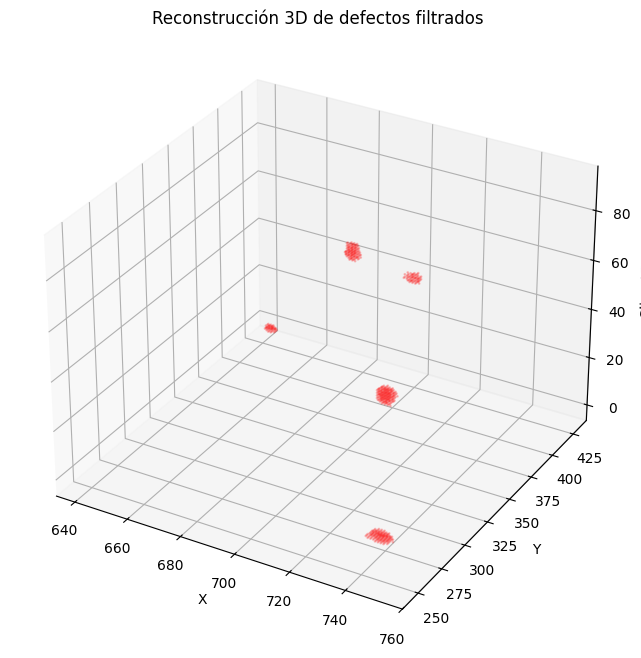

In [46]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np

# mask_filtrada debe ser binaria o etiquetada (ya filtrada)
# Si es etiquetada, la convertimos a binaria para visualizar todos los defectos juntos

mask_binaria = (mask_filtrada > 0)
mask_binaria_3d = mask_binaria[0, 0] 
# Obtenemos las coordenadas de los voxels con defecto
z, y, x = np.where(mask_binaria_3d)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='red', marker='o', s=1, alpha=0.2)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Slice (Z)')
ax.set_title('Reconstrucción 3D de defectos filtrados')
plt.show()

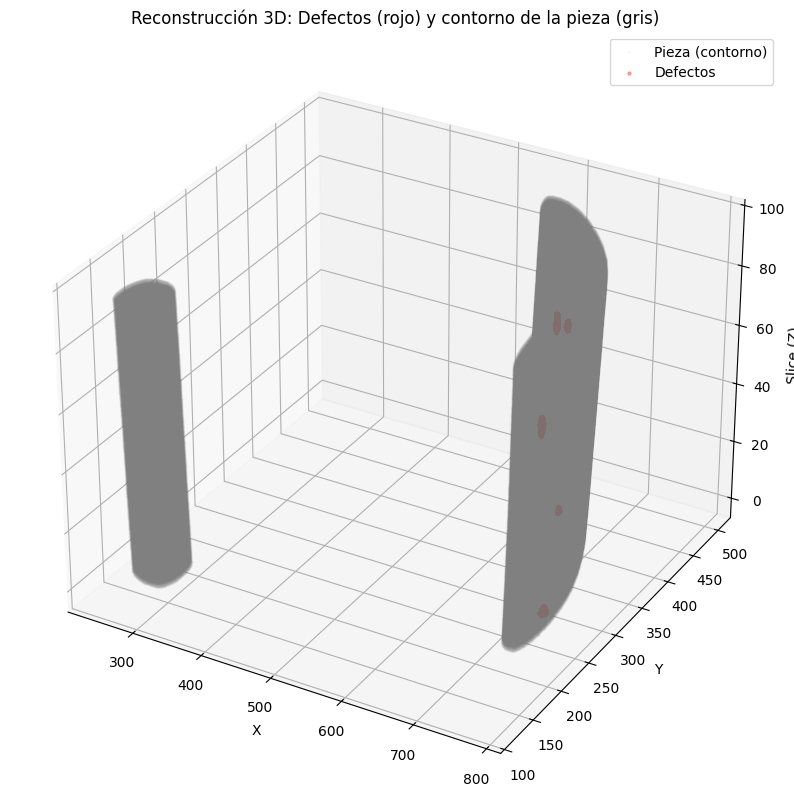

In [45]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import numpy as np

# --- Máscara binaria de defectos (3D) ---
mask_binaria = (mask_filtrada > 0)
mask_binaria_3d = mask_binaria[0, 0]  # (depth, height, width)

# --- Máscara binaria de la pieza (contorno) ---
# Usa la máscara de la pieza erosionada para el contorno
mask_pieza_binaria = mask_eroded[0, 0].numpy().astype(bool)  # (depth, height, width)

# --- Coordenadas de los voxels ---
z_def, y_def, x_def = np.where(mask_binaria_3d)
z_pieza, y_pieza, x_pieza = np.where(mask_pieza_binaria)

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Contorno de la pieza (gris, más transparente)
ax.scatter(x_pieza, y_pieza, z_pieza, c='gray', marker='o', s=1, alpha=0.05, label='Pieza (contorno)')

# Defectos (rojo)
ax.scatter(x_def, y_def, z_def, c='red', marker='o', s=5, alpha=0.3, label='Defectos')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Slice (Z)')
ax.set_title('Reconstrucción 3D: Defectos (rojo) y contorno de la pieza (gris)')
ax.legend(loc='upper right')
plt.show()